In [170]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from pathlib import Path
import matplotlib.pyplot as plt
import time 
from sklearn.utils import class_weight as cw
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras import models
import seaborn as sns
import matplotlib.image as mpimg
import scipy.stats as ss

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Flatten, Dense, Dropout

# Import des librairies pour la gestion des Callback
from keras.callbacks import Callback, ReduceLROnPlateau, EarlyStopping

In [ ]:
y_train=pd.read_csv('y_train.csv') # y_train
y_random=pd.read_csv('y_random.csv') # exemple de y_pred à soumettre
y_train

In [ ]:
data=pd.read_csv('data_final.csv')
data=data.iloc[:,1:]
data

In [ ]:
## Affichage des photos de plusieurs annonces

directory_in_str='D:/steve/reduced_images/test_piscine/'
for annonce in data['id_annonce'].unique()[:20]:
    print('\033[1m' + "Pour l'annonce N° {}".format(annonce) + '\033[0m',end='\n\n')
    path=directory_in_str+'ann_'+str(annonce)
    directory = os.fsencode(path)
    for file in os.listdir(directory):
        filename = os.fsdecode(file)
        if (filename.endswith(".png") or filename.endswith(".jpg")) and os.path.getsize(path+'/'+filename)>0:
            im=mpimg.imread(path+'/'+filename)
            plt.imshow(im)
            plt.show()
            continue
        else:
            continue
    print('#####'*15,end='\n\n')

In [ ]:
data_subset=data
data_subset

In [ ]:
start_time=time.time()
dic_ann={} # Dictionnaire comportant une liste des photos par anonce
y_l=[]     #Liste des target price par photo
dic_del={} #Dictionnaire avec le nombre de photo non prises en compte par annonce (exemple fichier vide)
dic_nb={}
dic_all={}
for annonce in data_subset['id_annonce'].unique():
    path=directory_in_str+'ann_'+str(annonce)
    directory = os.fsencode(path)
    count_del=0
    nb_photo=0
    im_list=[]
    for file in os.listdir(directory):
        filename = os.fsdecode(file)
        if (filename.endswith(".png") or filename.endswith(".jpg")) and os.path.getsize(path+'/'+filename)>0:
            im=mpimg.imread(path+'/'+filename)
            im_list.append(im)
            y_l.append(y_train[y_train['id_annonce']==annonce]['price'].values[0])
            nb_photo+=1
            dic_all[str(annonce)+'_'+str(int(nb_photo))]=im
        elif os.path.getsize(path+'/'+filename)==0:
            count_del+=1
    dic_nb[annonce]=nb_photo
    dic_del[annonce]=count_del
    dic_ann[annonce]=im_list
print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))

In [ ]:
#Permet d'identifier des photos d'annonceur, ainsi que des plans.
max_print=100
i=0
for key, value in dic_all.items():
    if value.mean()>215: #Si la moyenne des pixels est très élevé cela signifie qu'il y a beaucoup de blanc sur la photo
        i+=1
        plt.imshow(value)
        plt.show()
    if i==max_print:
        break

In [ ]:
#Ajout résolution moyennes des photos des annonces
dic_res={}
dic_mean={}
dic_std={}
dic_meanC={}
dic_logo_plan={}
for key, value in dic_ann.items(): #Pour chaque annonce
    l_res=[]
    l_R=[]
    l_G=[]
    l_B=[]
    mean=[]
    std=[]
    count_plan_logo=0
    for image in value: #On parcourt ses images et on extrait les stastiques voulues
        hauteur=len(image)
        largeur=len(image[0])
        if image.mean()>215:
            count_plan_logo+=1
        l_res.append(hauteur*largeur)
        l_R.append(image[:,:,0].mean())
        l_G.append(image[:,:,1].mean())
        l_B.append(image[:,:,2].mean())
        mean.append(image.mean())
        std.append(image.std())
    dic_meanC[key]=[np.mean(x) for x in [l_R,l_G,l_B]] #On fait la moyenne des moyennes des couleurs de toutes les images
    dic_res[key]=np.mean(l_res) #On fait la moyenne de la résolution de toutes les images
    dic_mean[key]=np.mean(mean) #On fait la moyenne de la moyenne des pixels de toutes les images
    dic_std[key]=np.mean(std) #On fait la moyenne de l'ecart type des pixels de toutes les images
    dic_logo_plan[key]=count_plan_logo #On ajoute le nombre de logo & plan "trouvé"
    

In [ ]:
df_image=pd.DataFrame.from_dict(dic_nb,orient='index',columns=['nb_photos'])
df_image['nb_photos_dataset']=data_subset['nb_photos'].values
df_image['resolution_moyenne']=dic_res.values()
df_image['mean_pixel']=dic_mean.values()
df_image['std_pixel']=dic_std.values()
df_image['Mean_Color']=dic_meanC.values()
df_image['mean_red']=df_image.apply(
    lambda x: x['Mean_Color'][0],axis=1)
df_image['mean_green']=df_image.apply(
    lambda x: x['Mean_Color'][1],axis=1)
df_image['mean_blue']=df_image.apply(
    lambda x: x['Mean_Color'][2],axis=1)

df_image.drop(['Mean_Color'],axis=1,inplace=True)
df_image['count_logo_plan']=dic_logo_plan.values()
df_image

On peut voir que le nombre de photo dans le jeu de donnée ne correspond pas à toutes les photos disponibles. En effet, on peut voir qu'ils ont capé à 6 photos maximums par annonce

In [ ]:
# Changement du nom des colonnes pour éviter + Suppresion 'nb_photos_dataset' pour éviter le redondance

df_image.columns = ['nb_photos_dossier', 'nb_photos_dataset', 'resolution_moyenne', 'mean_pixel',
       'std_pixel', 'mean_red', 'mean_green', 'mean_blue', 'count_logo_plan']
df_image.drop(['nb_photos_dataset'],axis=1,inplace=True)
df_image

In [ ]:
df_image.columns.values

### Recherche de la feature Piscine 

In [171]:
EPOCHS                  = 10   # Nombre d'epoch
image_size               = (224,224)    # Taille des images
BATCH_SIZE              = 32    # Pour le traitement par lot des images (optimisation de la decente de gradient)
STOPPING_PATIENCE       = 10    # Callback pour stopper si le modèle n'apprend plus
VERBOSE                 = 0     # Niveau de verbosité
MODEL_NAME              = 'cnn_80epochs_imgsize160'
OPTIMIZER               = 'adam'
TEST_PATH               = 'D:/steve/reduced_images/test_piscine/'
TRAINING_DIR_PISCINE    = "./train_piscine/"
TRAIN_MODEL             = True  # Entrainement du modele (True) ou chargement (False)
batch_size = 32

### Création des dataset 

Nous avons créer un dossier composé de deux dossier servant de labels. 
Le premier dossier est 0_piscine indiquant que c'est un dossier ne contenant pas de photos de piscine.
Le deuxième dossier est 1_piscine indiquant qu'il est composé de photos de piscines

Ainsi avec la fonction image_dataset_from_directory il est possible de créer directement des dataset labélisé 

In [172]:

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAINING_DIR_PISCINE,
    label_mode='categorical',
    validation_split=0.2,
    subset="training",
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAINING_DIR_PISCINE,
    validation_split=0.2,
    subset="validation",
    label_mode='categorical',
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

test = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_PATH,
    label_mode=None,
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

Found 321 files belonging to 2 classes.
Using 257 files for training.
Found 321 files belonging to 2 classes.
Using 64 files for validation.
Found 561 files belonging to 1 classes.


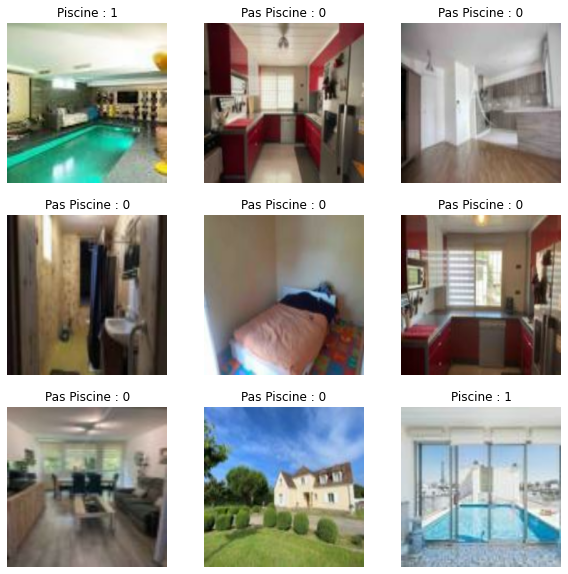

In [163]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        if labels[i][0].numpy()==0.0:
            plt.title("Piscine : 1")
        else:
            plt.title("Pas Piscine : 0")
        plt.axis("off")

### Essayons un premier réseau de neurones afin de détecter des piscines

In [173]:
# Initialisation du modèle
from tensorflow.keras.models import Model

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
tf.keras.layers.experimental.preprocessing.RandomCrop(224,224),
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
tf.keras.layers.Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      input_shape=(224, 224, 3),
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Dropout(0.1),
tf.keras.layers.Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Flatten(),
tf.keras.layers.Dense(512, activation='relu'),
tf.keras.layers.Dropout(0.1)
])

inputs = tf.keras.Input(shape=(224,224,3))
x = data_augmentation(inputs)
#x = preprocess_input(x)

#x = GlobalAveragePooling2D()(x)
y = Dense(2, activation='softmax')(x) #final layer with softmax activation
model = Model(inputs=inputs, outputs=y, name="Steven/Thomas")

model.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy','AUC'])
model.summary()  # As a reminder.



Model: "Steven/Thomas"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_66 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_46 (Sequential)  (None, 512)               3228816   
                                                                 
 dense_39 (Dense)            (None, 2)                 1026      
                                                                 
Total params: 3,229,842
Trainable params: 3,229,650
Non-trainable params: 192
_________________________________________________________________


In [165]:

history = model.fit(train_ds, epochs=20, validation_data=val_ds)

Epoch 1/20
9/9 [==============================] - 11s 973ms/step - loss: 1.5027 - accuracy: 0.8054 - auc: 0.8683 - val_loss: 0.9441 - val_accuracy: 0.5625 - val_auc: 0.6248
Epoch 2/20
9/9 [==============================] - 9s 912ms/step - loss: 1.2404 - accuracy: 0.8988 - auc: 0.9184 - val_loss: 1.2146 - val_accuracy: 0.5781 - val_auc: 0.6649
Epoch 3/20
9/9 [==============================] - 8s 902ms/step - loss: 1.0946 - accuracy: 0.9027 - auc: 0.9377 - val_loss: 4.4271 - val_accuracy: 0.4688 - val_auc: 0.4980
Epoch 4/20
9/9 [==============================] - 9s 929ms/step - loss: 0.5507 - accuracy: 0.8911 - auc: 0.9457 - val_loss: 6.4707 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 5/20
9/9 [==============================] - 8s 894ms/step - loss: 0.5931 - accuracy: 0.9339 - auc: 0.9421 - val_loss: 8.6670 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 6/20
9/9 [==============================] - 9s 963ms/step - loss: 0.4544 - accuracy: 0.9377 - auc: 0.9641 - val_loss: 12.0249 - val_a

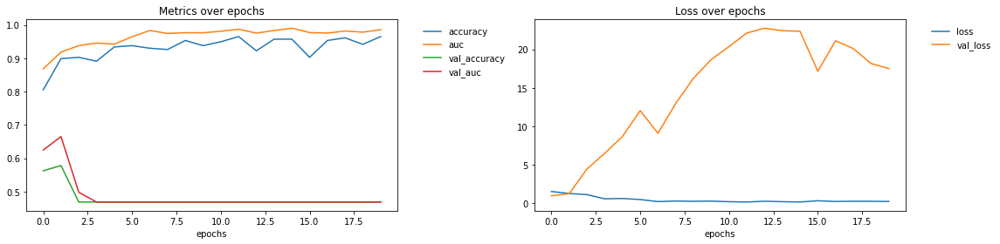

In [166]:
fig, axs = plt.subplots(1, 2, figsize=(16, 4))

axs[0].plot(history.history["accuracy"], label="accuracy")
axs[0].plot(history.history["auc"], label="auc")

axs[0].plot(history.history["val_accuracy"], label="val_accuracy")
axs[0].plot(history.history["val_auc"], label="val_auc")

axs[0].set_title("Metrics over epochs")
axs[0].set_xlabel("epochs")

axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

axs[1].plot(history.history["loss"], label="loss")
axs[1].plot(history.history["val_loss"], label="val_loss")

axs[1].set_title("Loss over epochs")
axs[1].set_xlabel("epochs")
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

fig.tight_layout()
plt.show()

### Notre modèle n'a pas une très bonne accuracy sur le validation set, ainsi il ne va pas très bien prédire.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


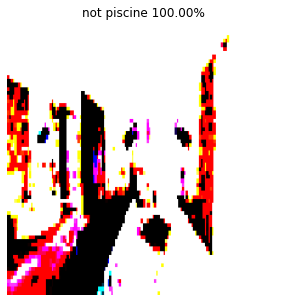

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


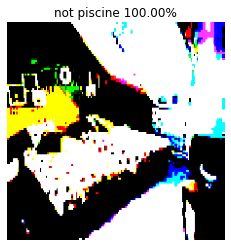

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


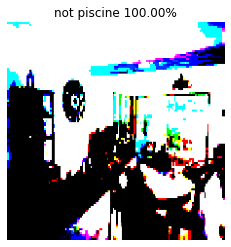

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


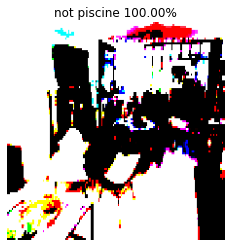

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


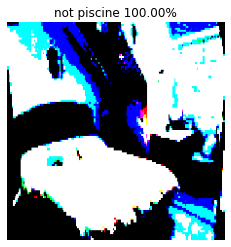

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


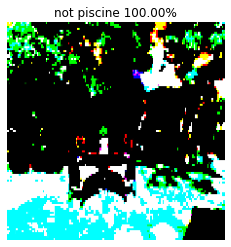

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


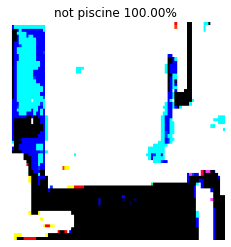

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


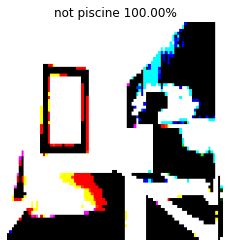

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


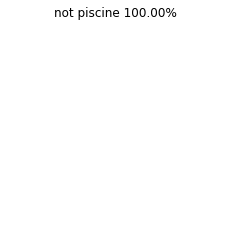

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


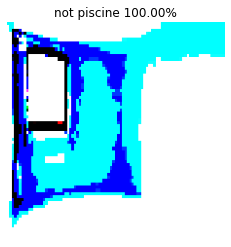

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


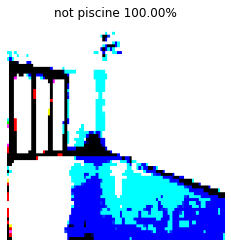

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


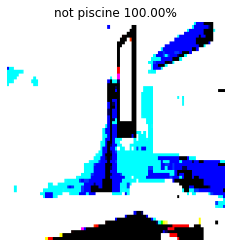

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


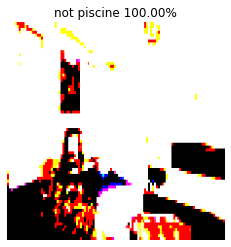

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


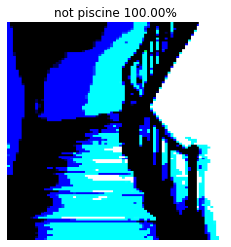

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


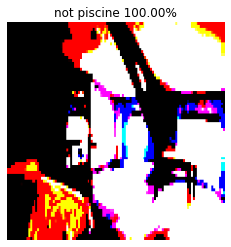

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


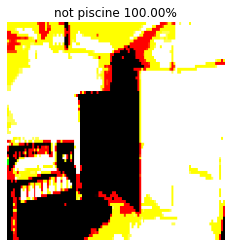

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


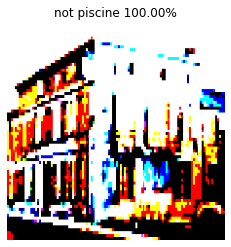

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


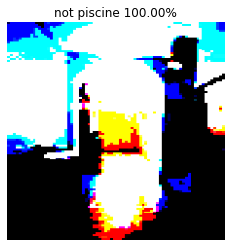

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


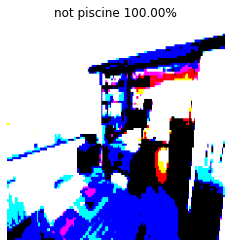

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


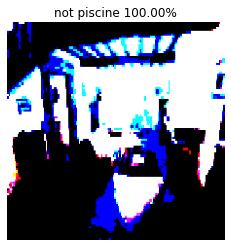

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


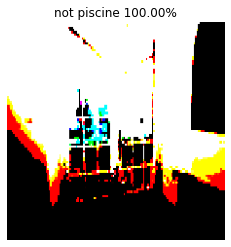

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


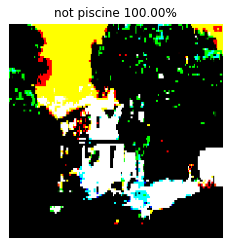

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


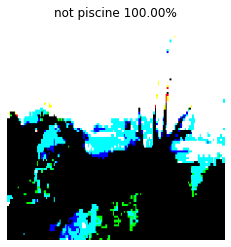

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


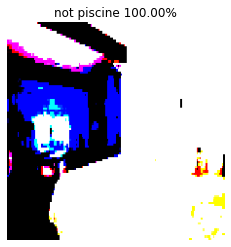

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


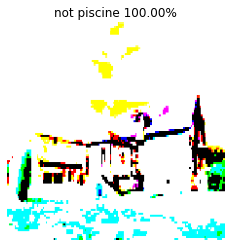

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


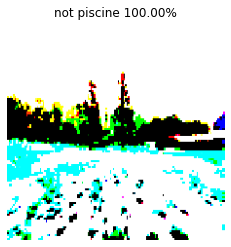

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


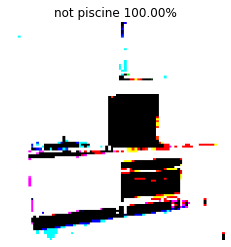

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


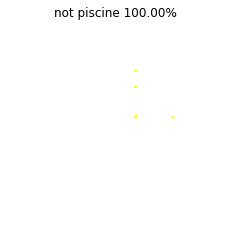

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


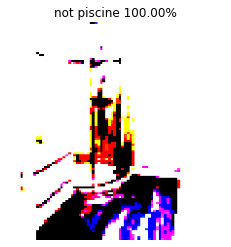

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


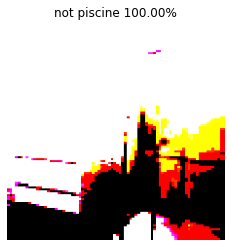

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


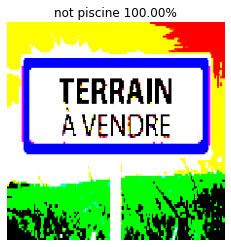

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


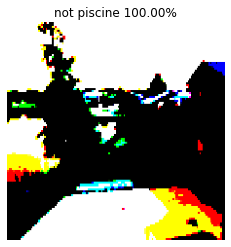

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


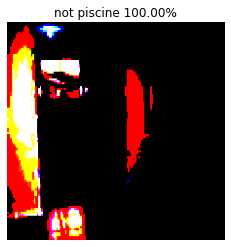

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


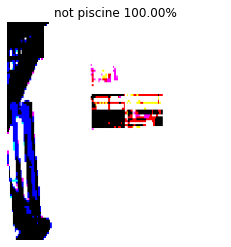

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


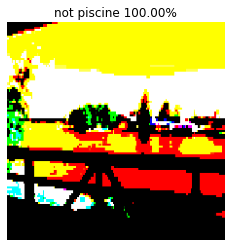

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


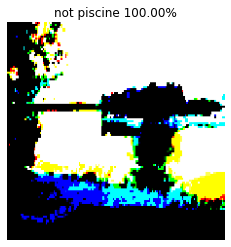

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


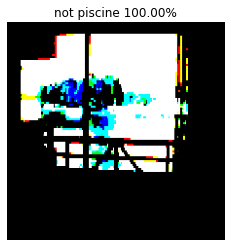

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


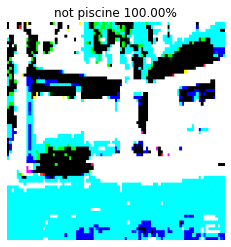

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


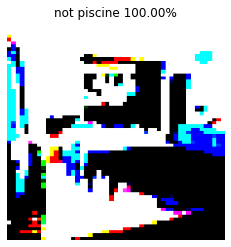

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


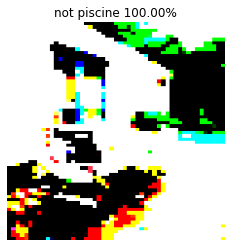

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


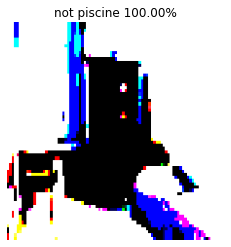

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


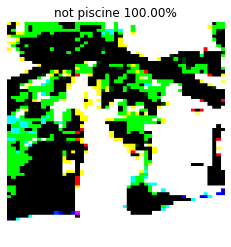

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


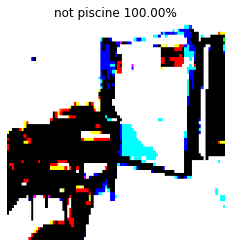

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


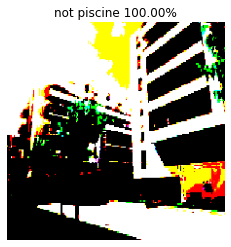

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


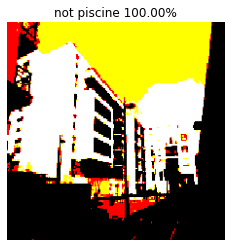

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


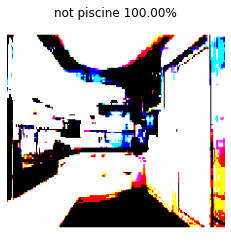

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


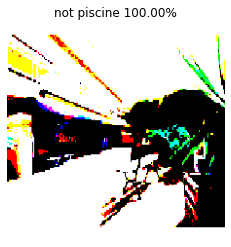

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


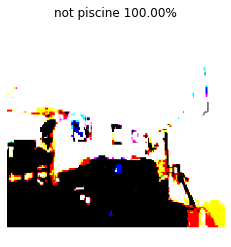

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


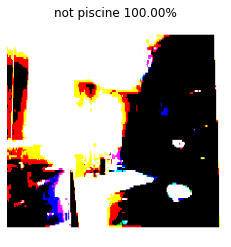

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


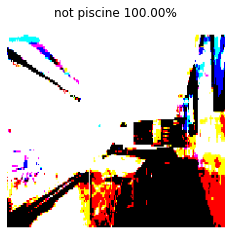

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


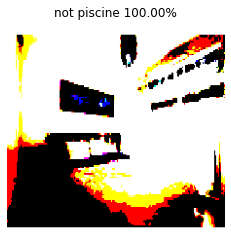

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


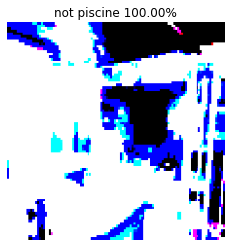

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


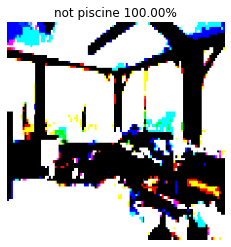

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


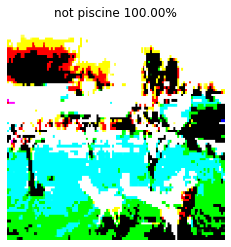

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


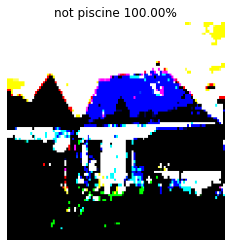

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


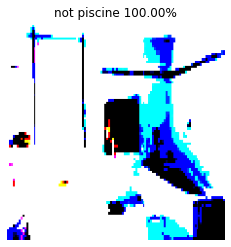

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


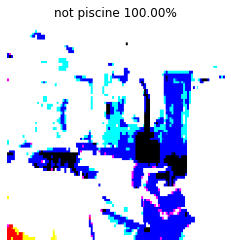

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


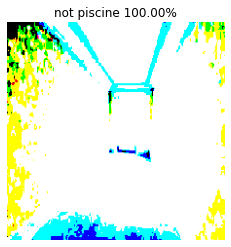

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


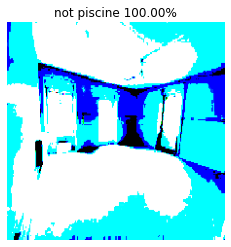

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


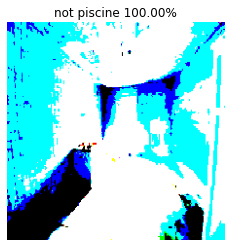

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


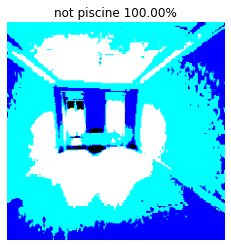

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


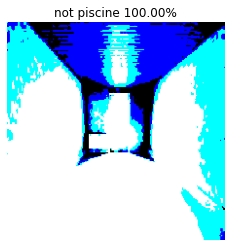

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


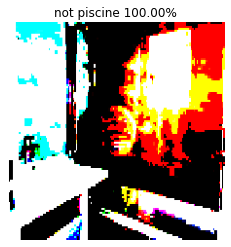

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


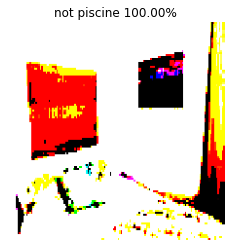

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


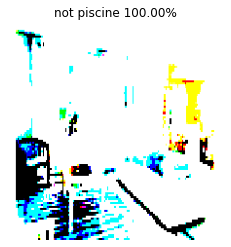

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


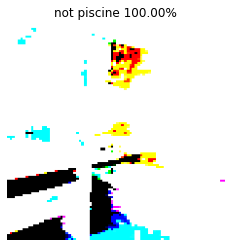

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


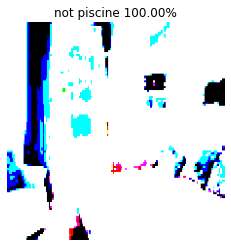

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


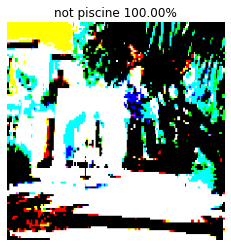

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


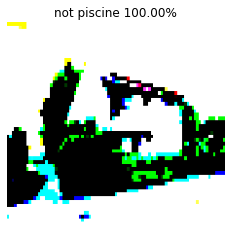

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


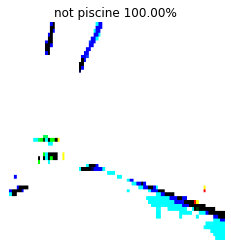

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


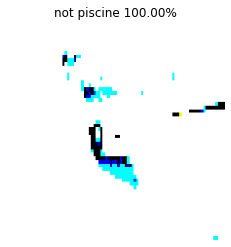

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


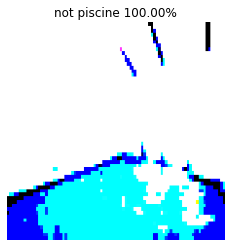

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


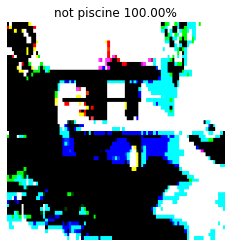

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


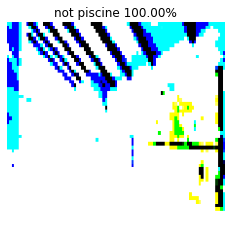

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


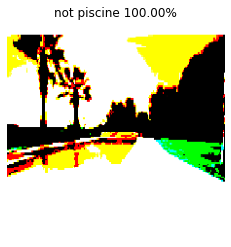

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


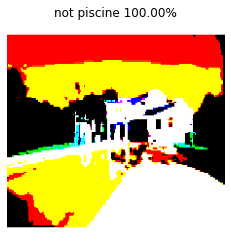

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


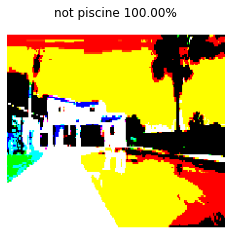

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


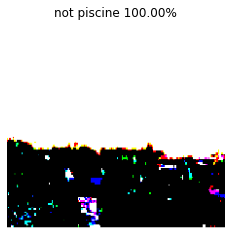

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


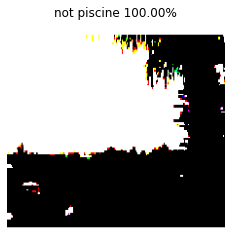

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


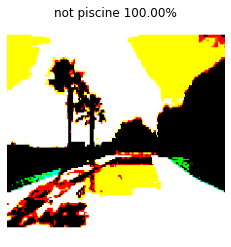

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


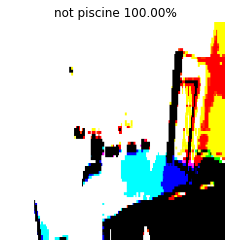

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


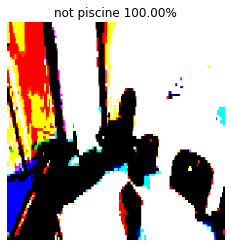

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


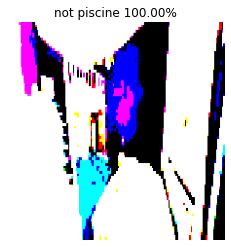

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


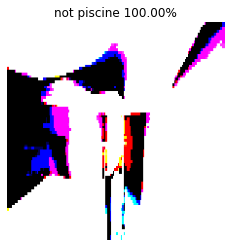

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


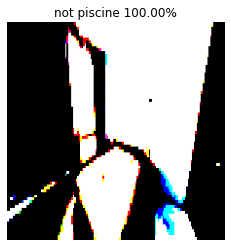

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


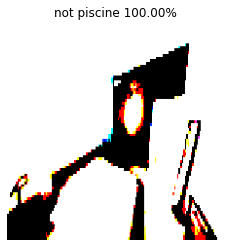

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


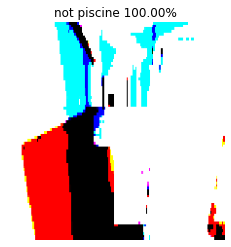

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


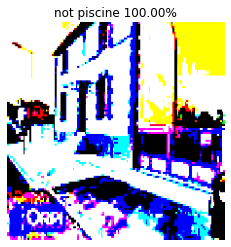

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


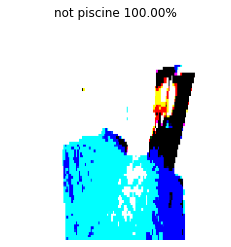

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


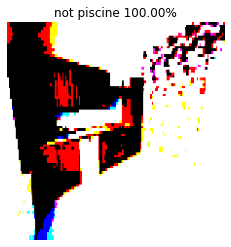

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


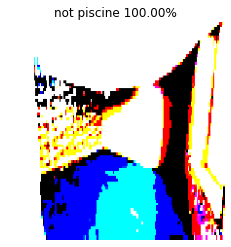

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


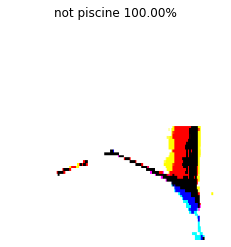

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


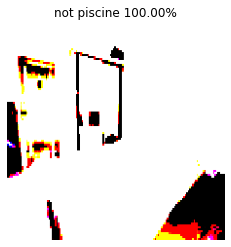

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


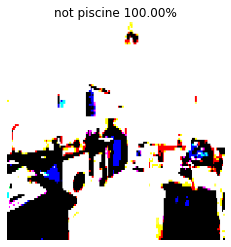

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


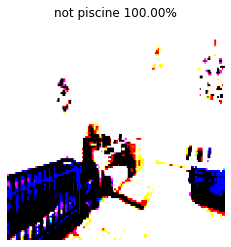

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


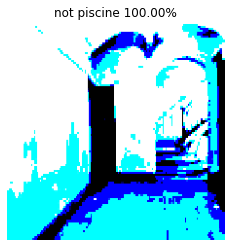

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


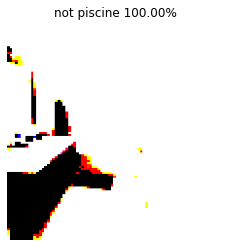

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


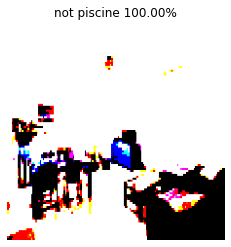

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


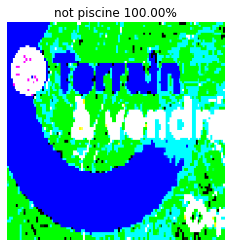

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


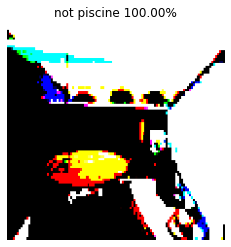

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


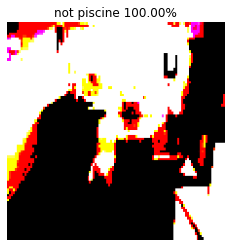

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


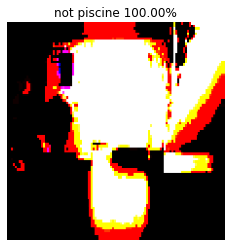

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


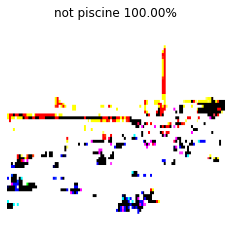

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


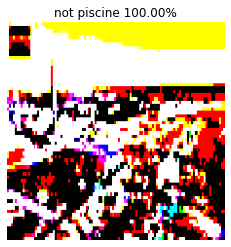

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


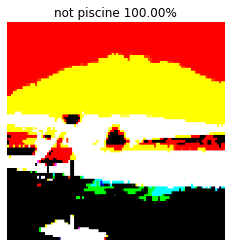

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


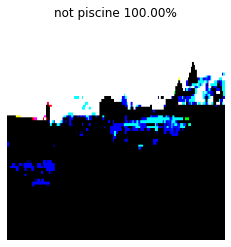

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


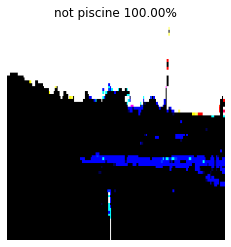

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


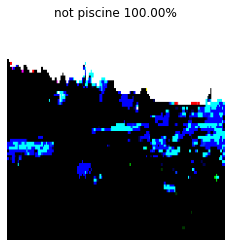

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


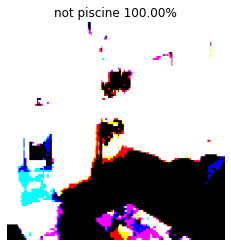

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


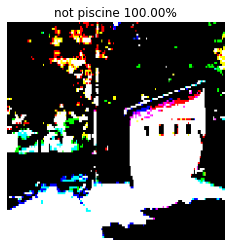

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


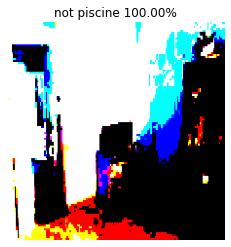

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


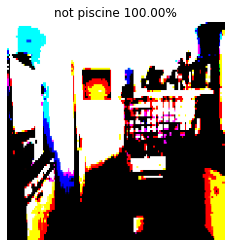

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


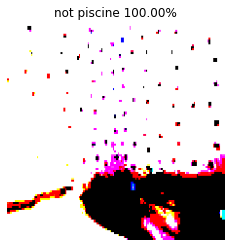

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


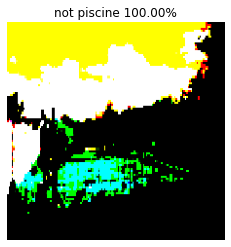

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


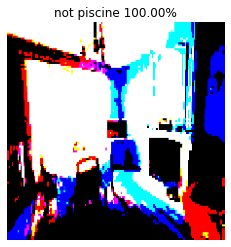

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


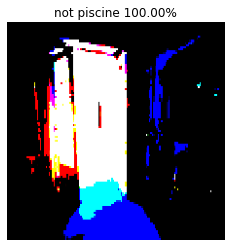

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


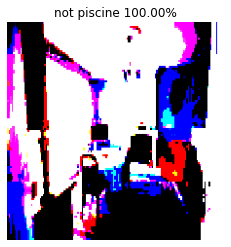

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


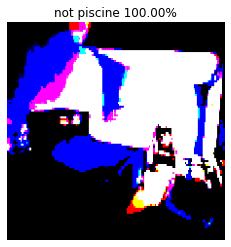

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


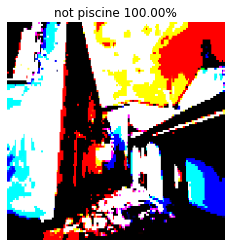

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


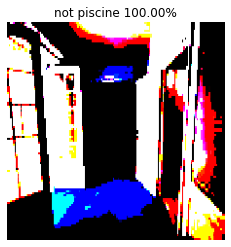

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


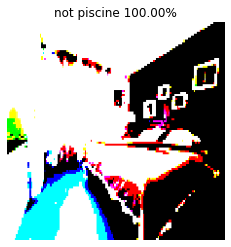

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


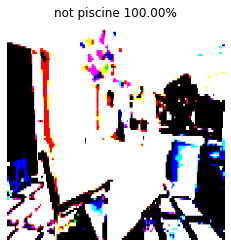

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


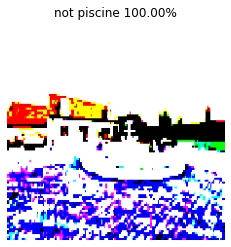

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


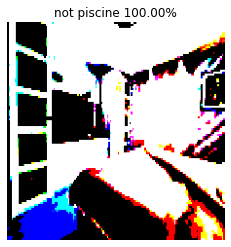

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


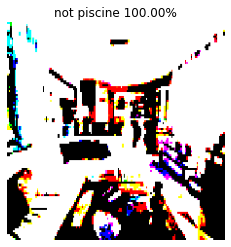

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


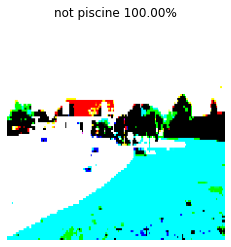

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


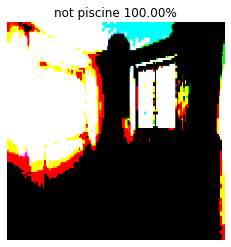

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


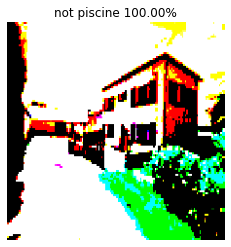

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


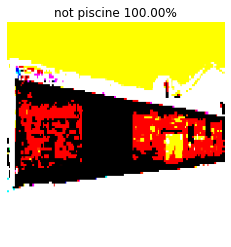

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


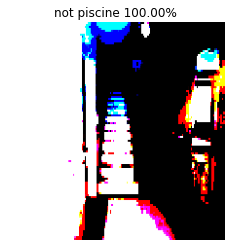

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


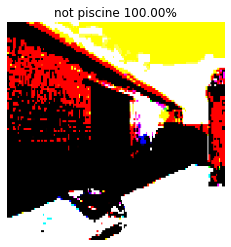

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


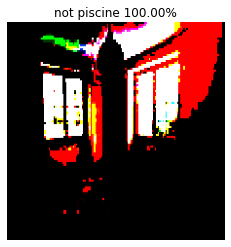

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


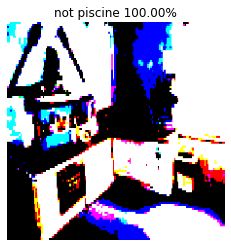

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


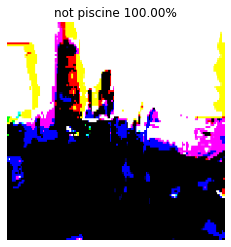

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


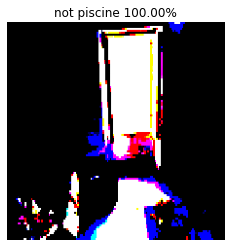

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


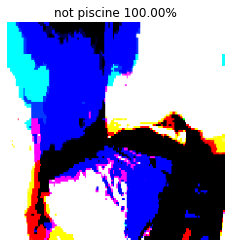

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


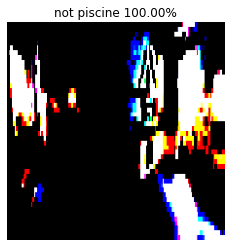

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


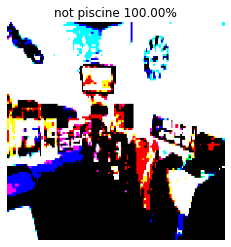

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


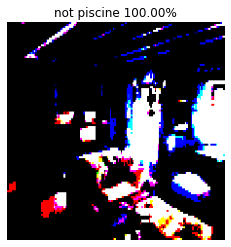

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


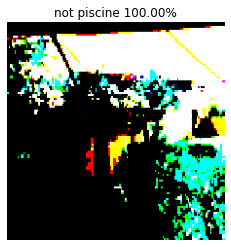

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


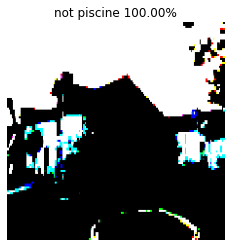

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


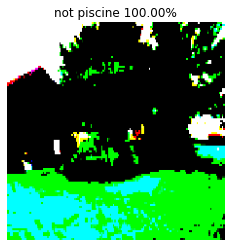

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


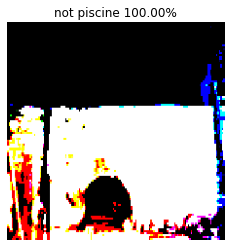

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


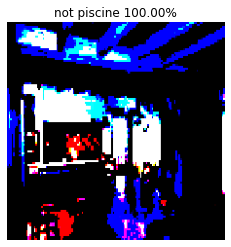

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


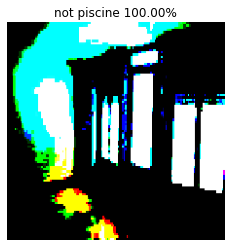

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


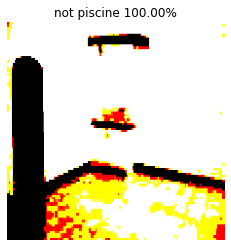

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


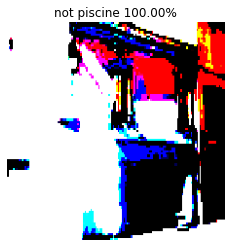

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


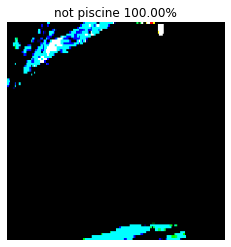

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


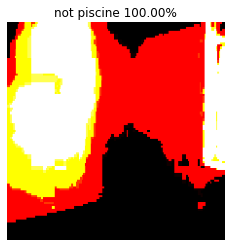

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


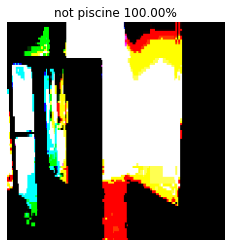

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


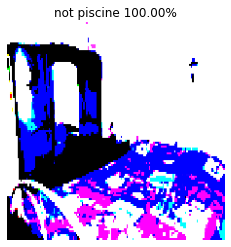

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


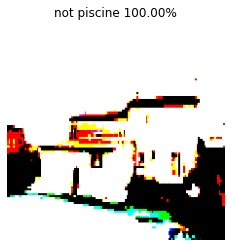

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


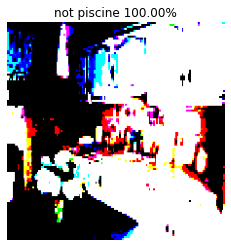

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


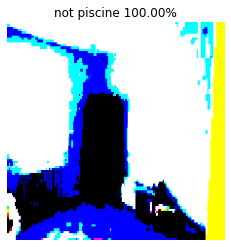

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


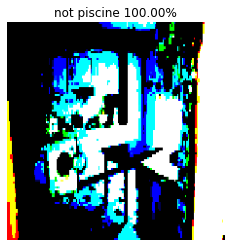

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


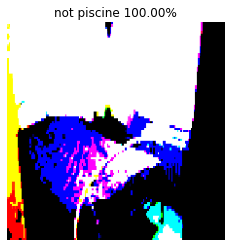

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


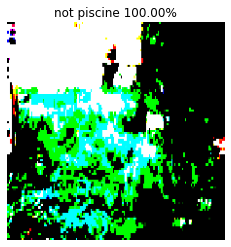

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


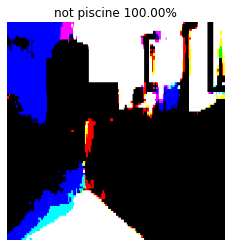

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


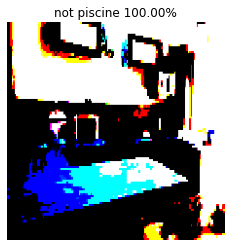

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


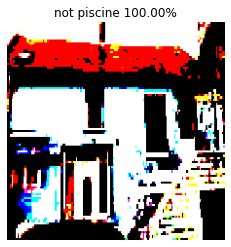

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


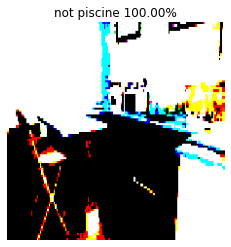

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


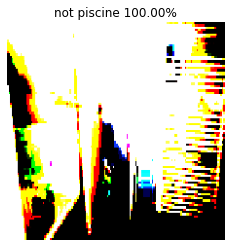

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


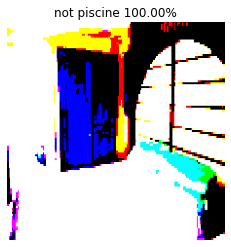

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


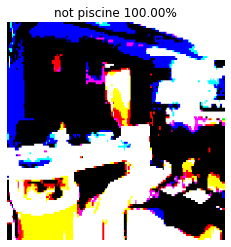

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


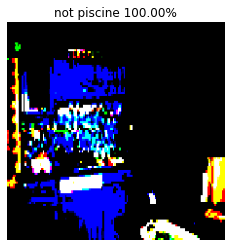

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


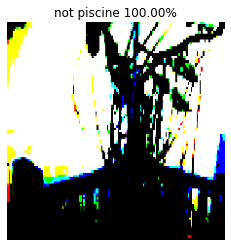

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


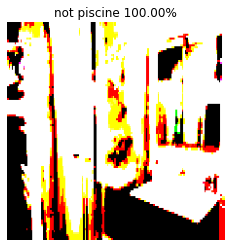

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


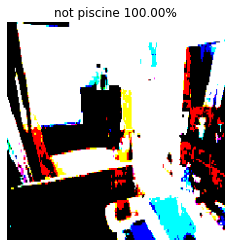

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


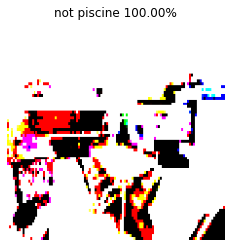

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


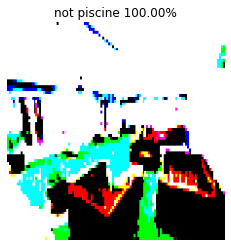

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


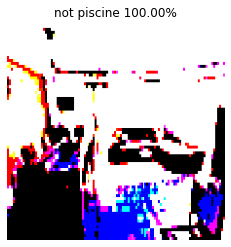

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


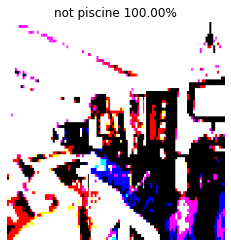

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


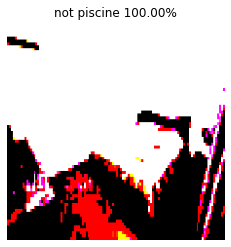

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


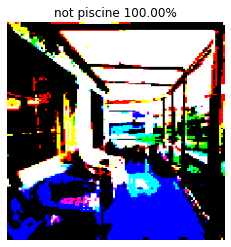

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


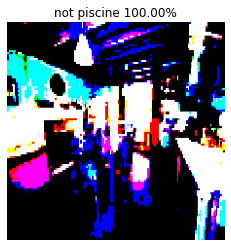

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


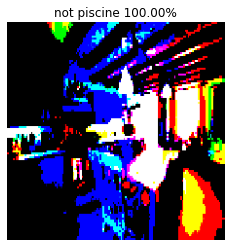

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


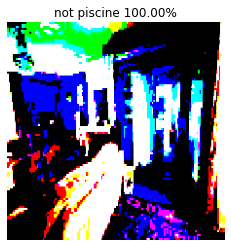

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


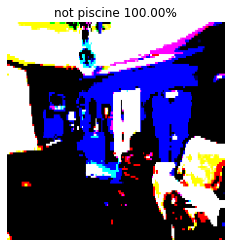

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


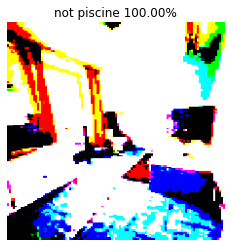

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


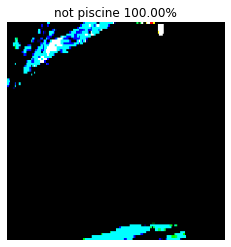

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


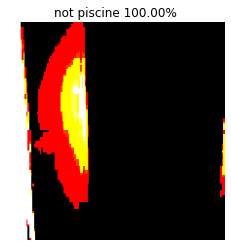

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


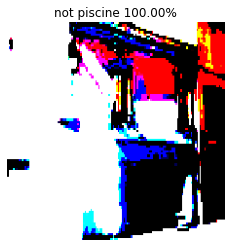

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


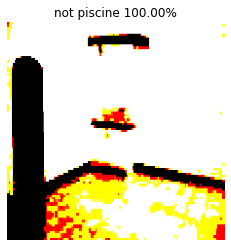

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


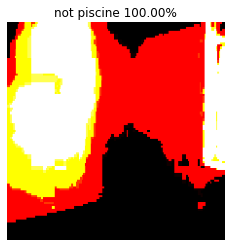

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


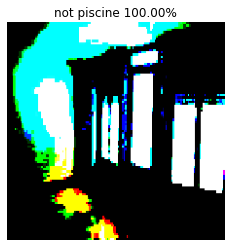

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


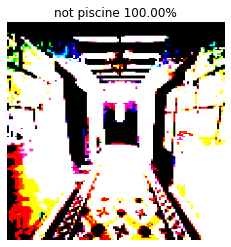

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


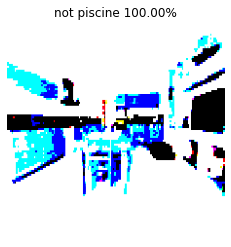

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


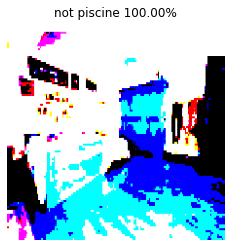

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


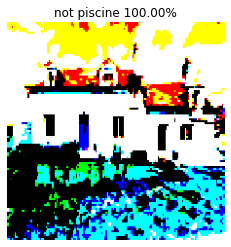

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


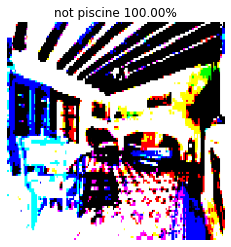

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


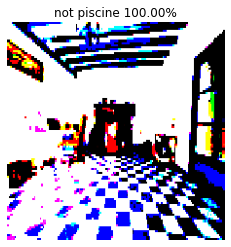

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


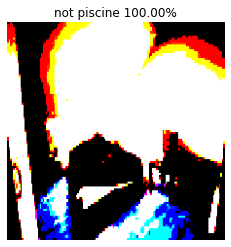

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


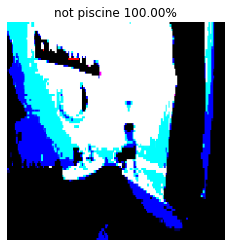

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


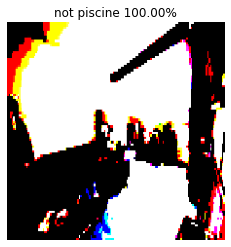

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


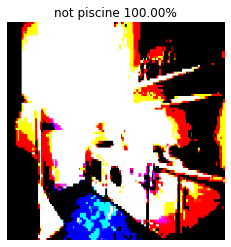

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


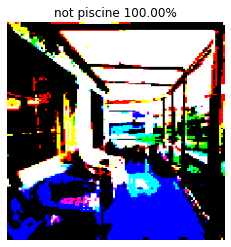

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


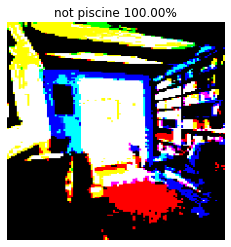

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


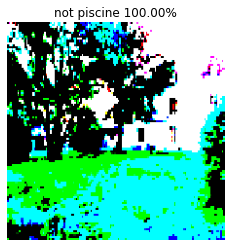

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


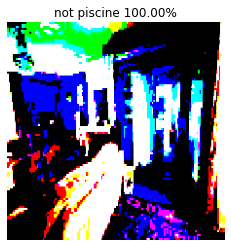

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


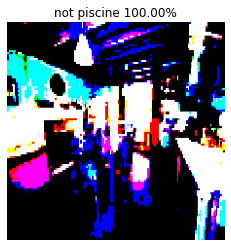

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


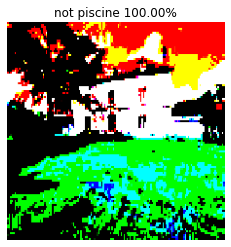

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


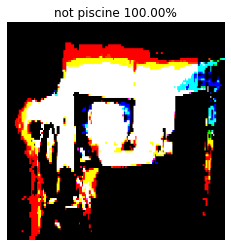

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


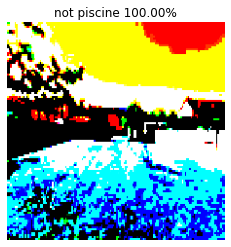

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


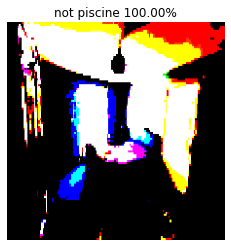

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


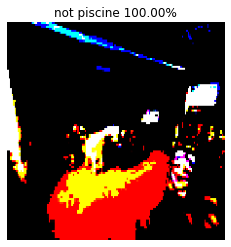

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


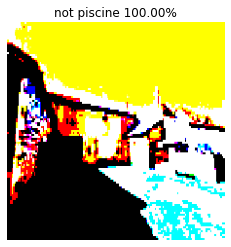

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


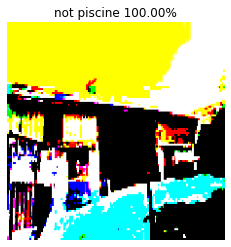

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


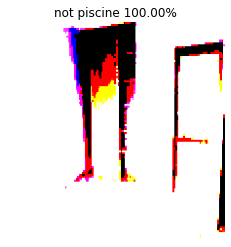

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


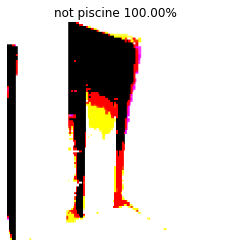

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


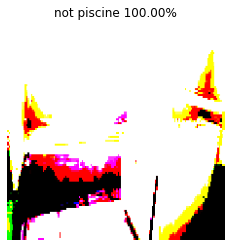

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


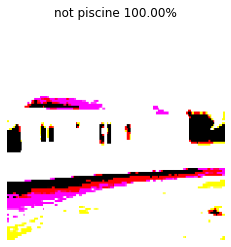

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


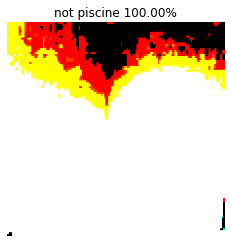

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


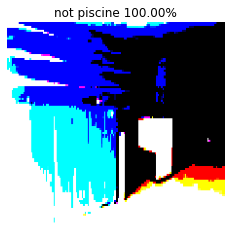

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


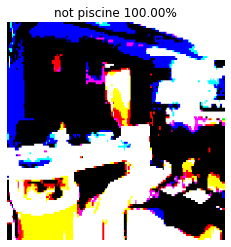

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


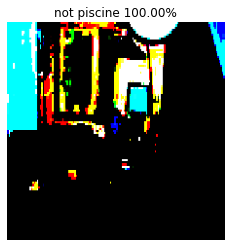

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


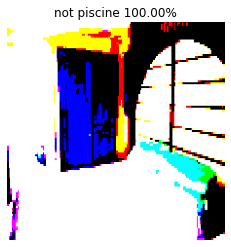

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


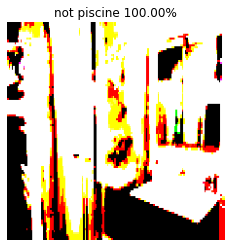

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


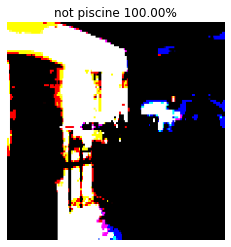

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


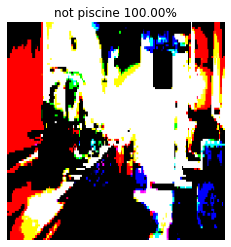

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


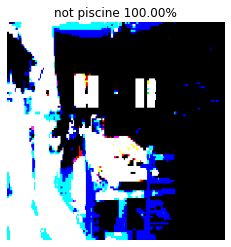

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


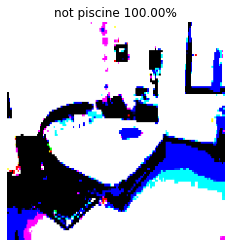

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


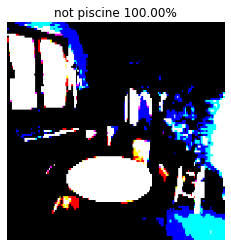

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


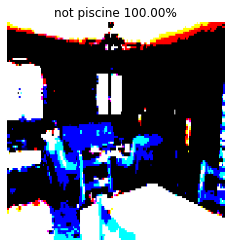

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


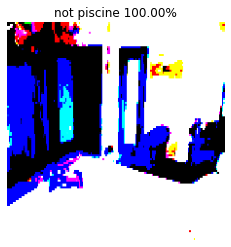

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


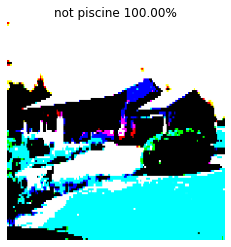

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


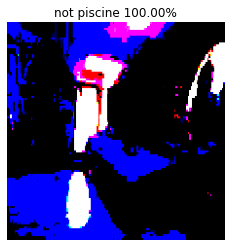

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


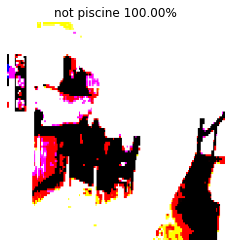

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


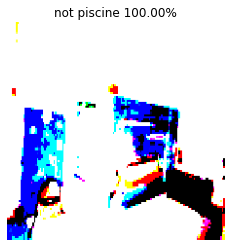

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


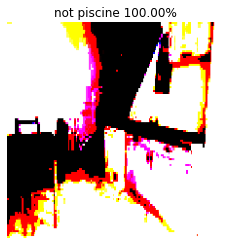

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


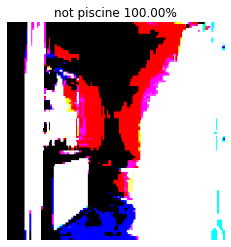

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


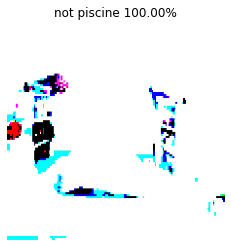

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


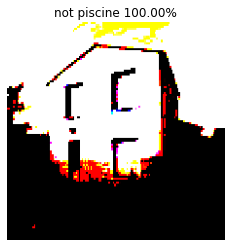

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


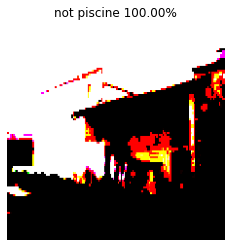

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


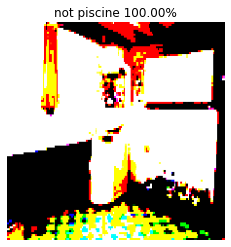

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


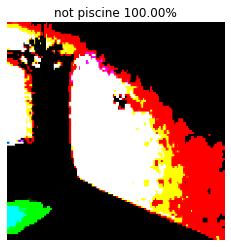

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


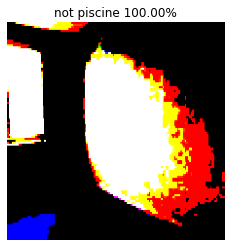

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


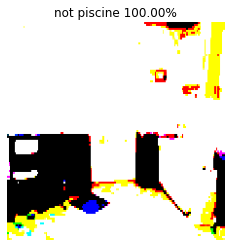

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


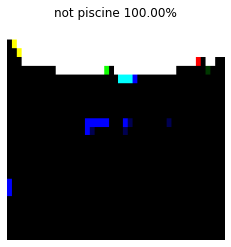

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


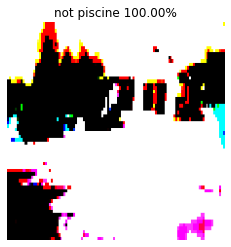

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


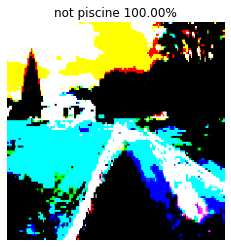

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


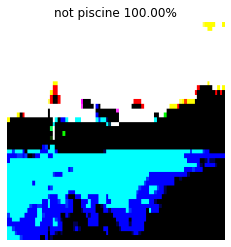

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


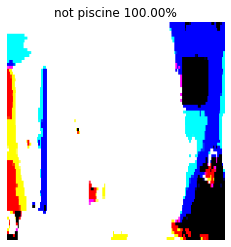

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


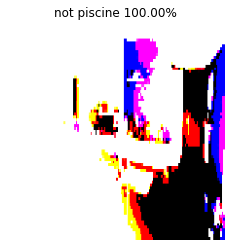

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


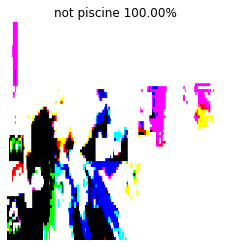

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


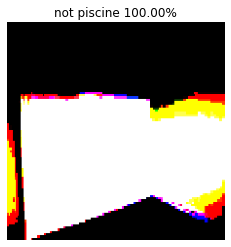

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


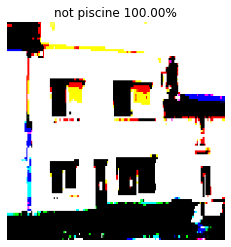

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


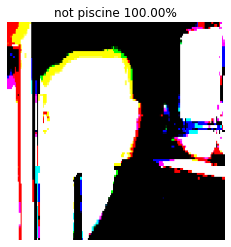

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


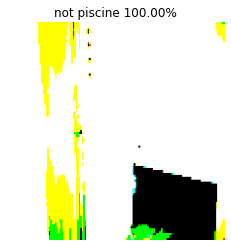

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


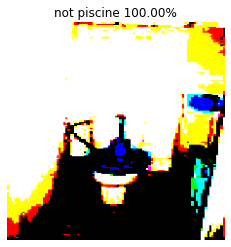

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


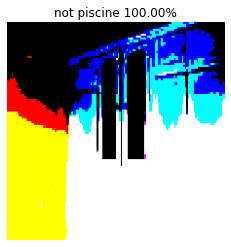

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


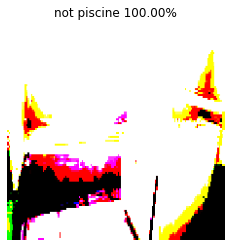

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


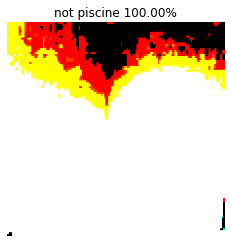

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


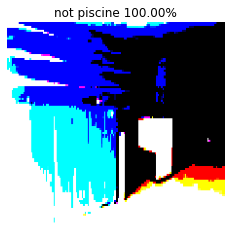

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


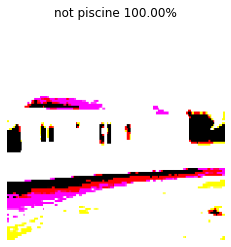

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


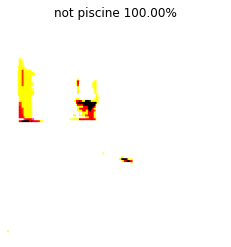

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


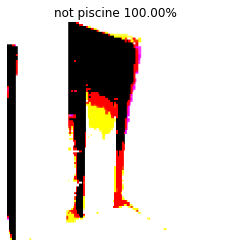

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


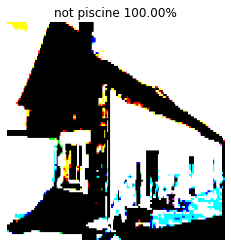

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


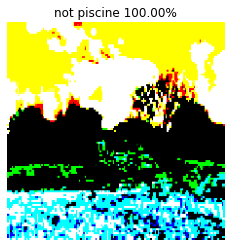

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


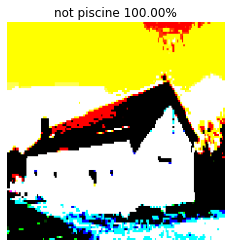

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


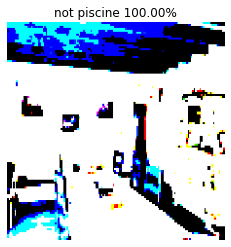

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


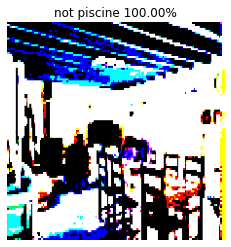

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


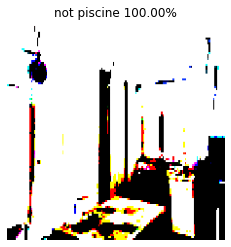

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


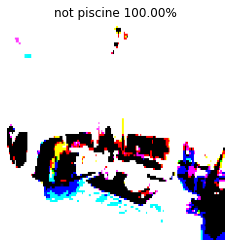

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


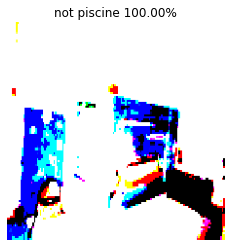

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


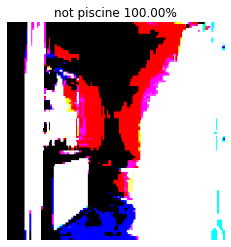

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


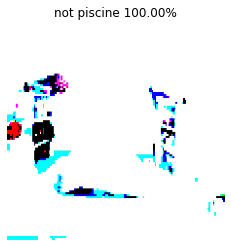

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


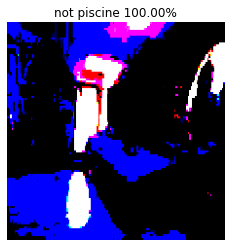

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


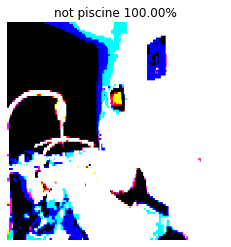

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


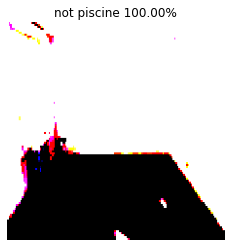

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


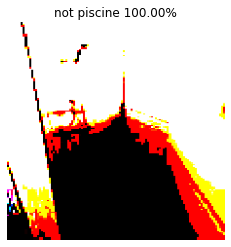

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


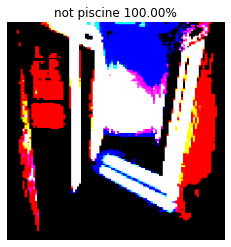

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


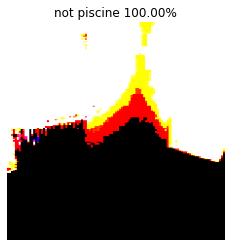

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


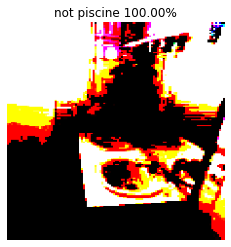

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


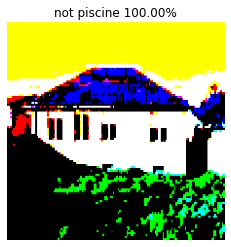

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


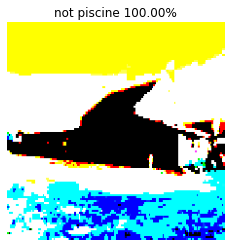

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


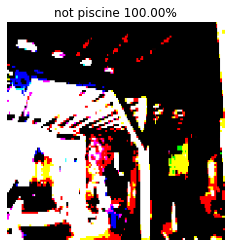

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


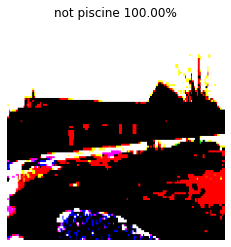

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


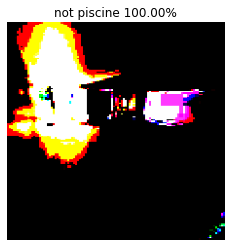

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


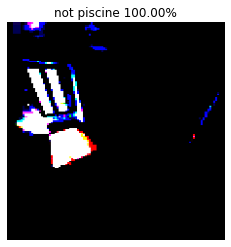

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


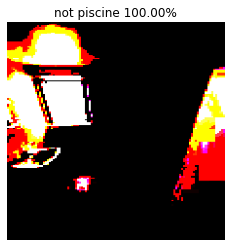

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


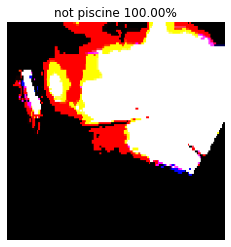

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


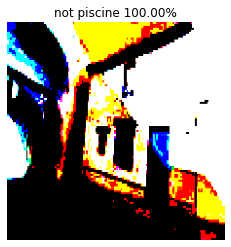

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


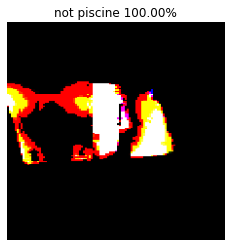

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


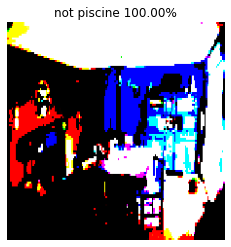

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


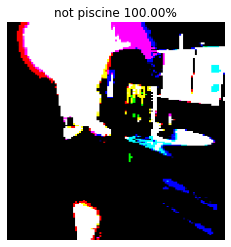

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


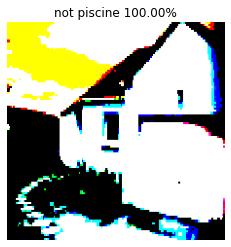

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


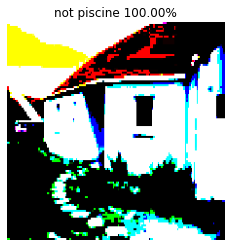

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


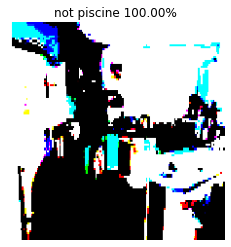

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


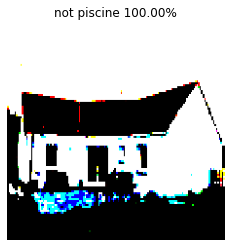

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


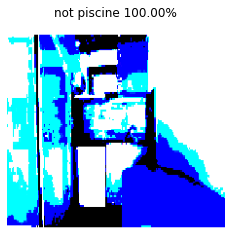

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


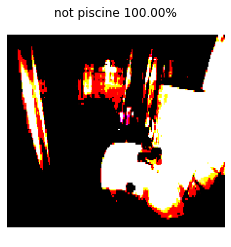

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


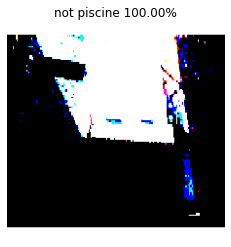

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


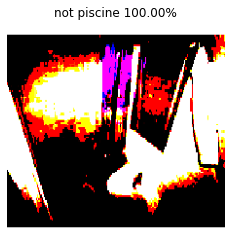

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


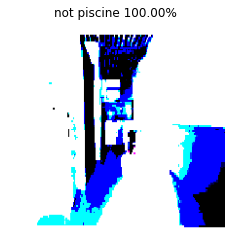

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


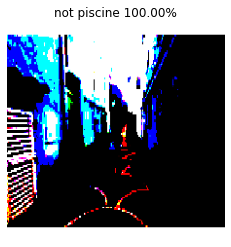

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


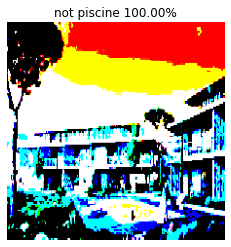

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


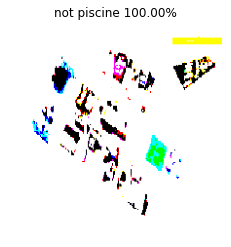

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


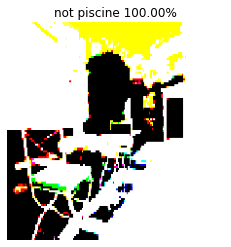

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


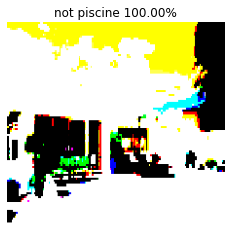

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


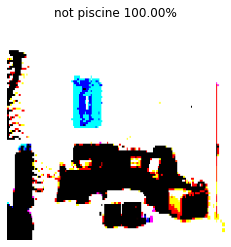

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


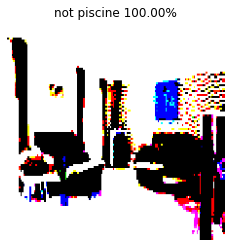

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


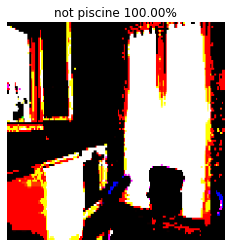

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


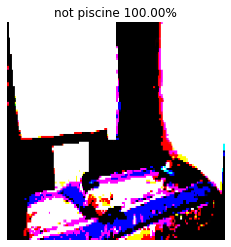

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


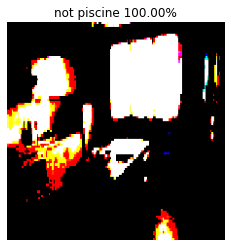

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


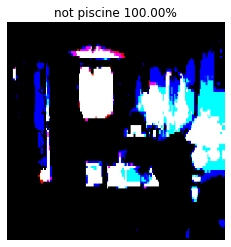

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


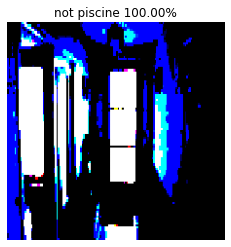

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


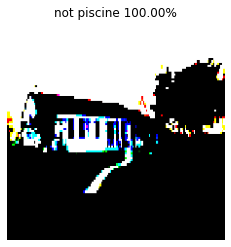

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


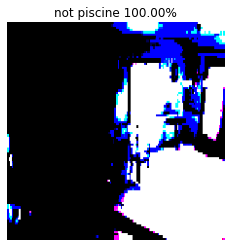

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


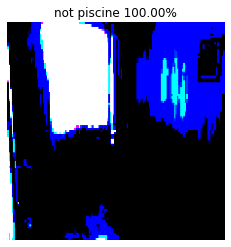

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


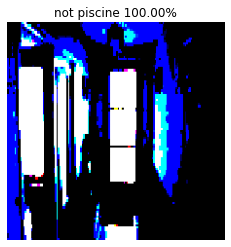

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


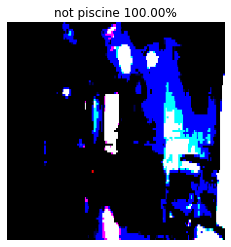

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


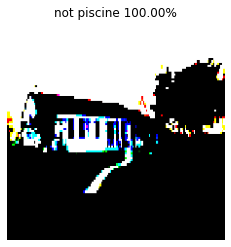

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


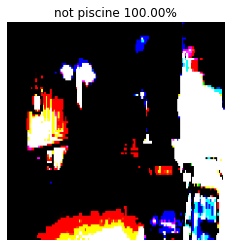

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


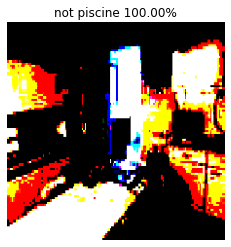

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


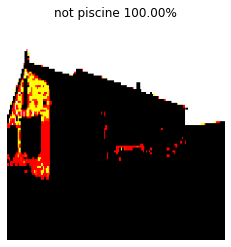

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


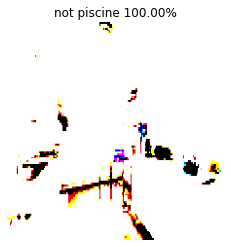

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


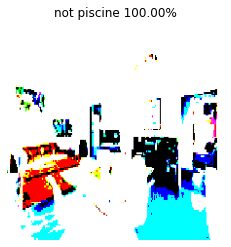

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


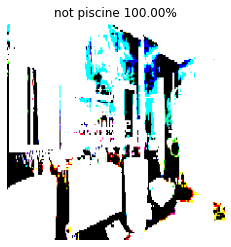

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


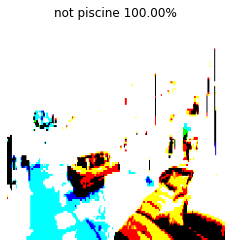

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


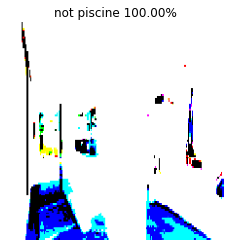

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


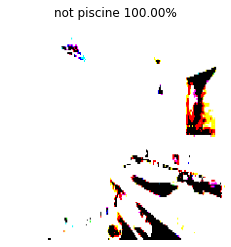

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


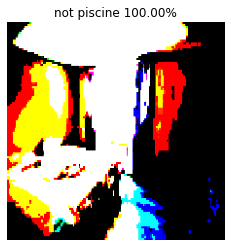

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


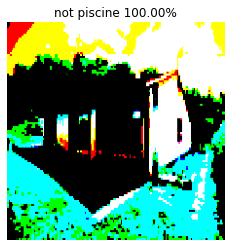

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


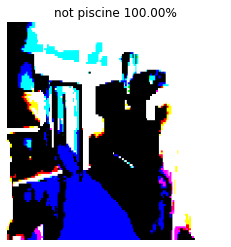

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


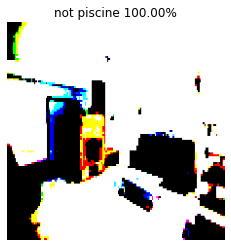

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


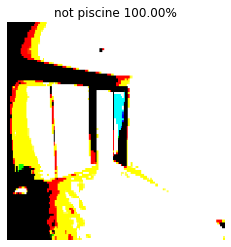

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


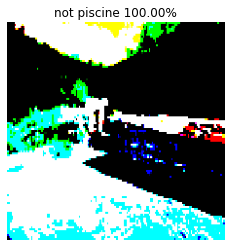

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


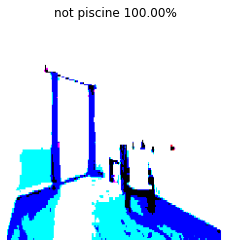

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


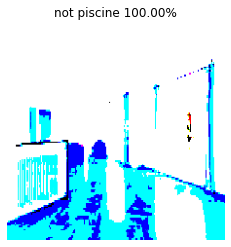

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


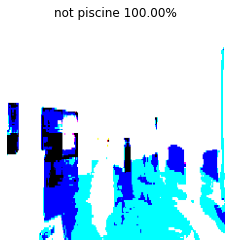

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


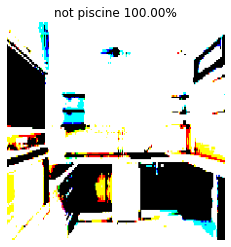

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


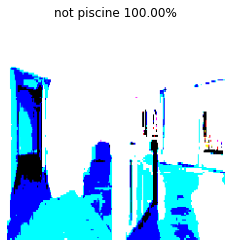

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


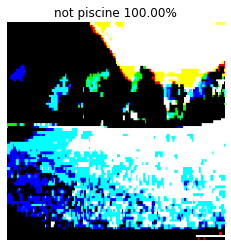

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


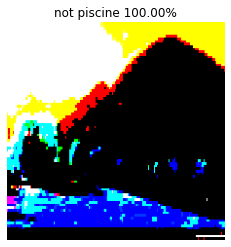

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


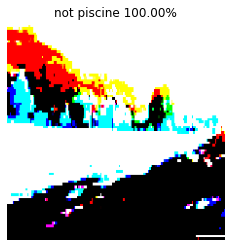

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


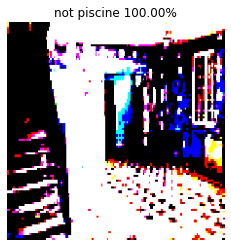

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


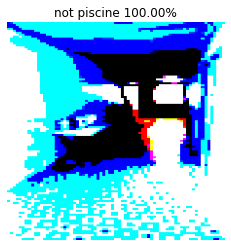

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


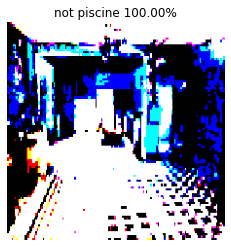

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


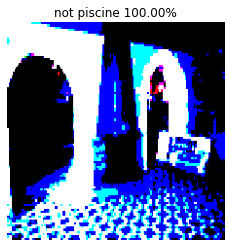

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


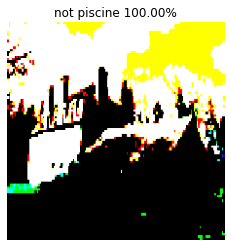

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


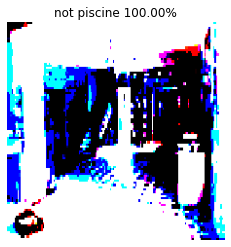

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


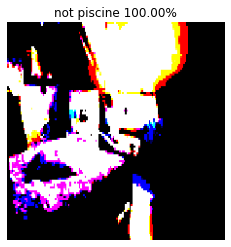

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


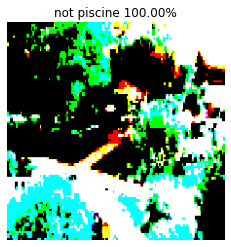

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


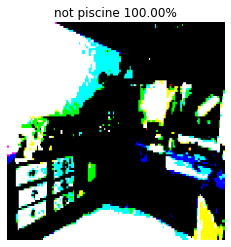

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


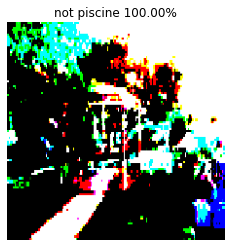

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


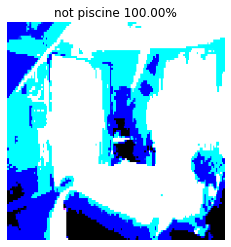

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


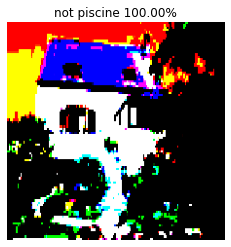

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


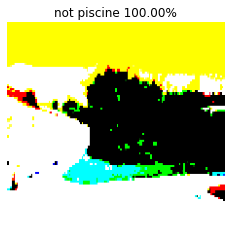

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


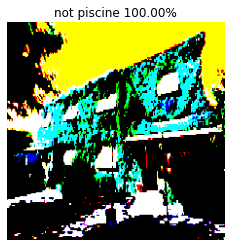

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


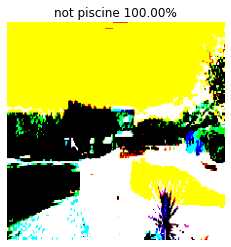

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


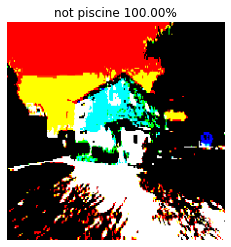

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


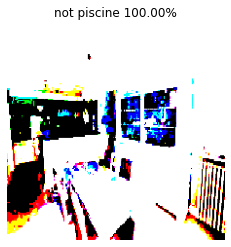

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


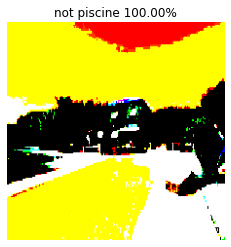

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


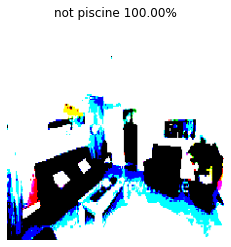

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


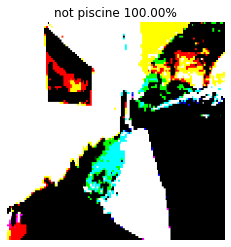

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


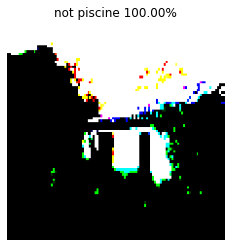

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


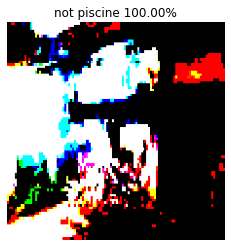

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


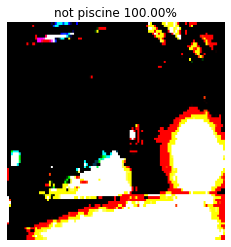

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


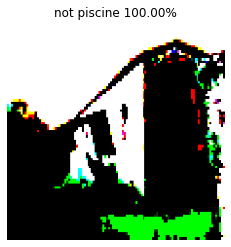

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


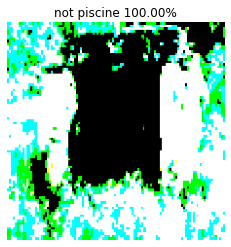

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


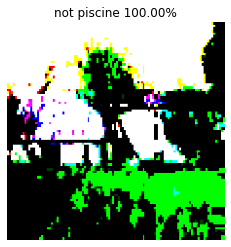

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


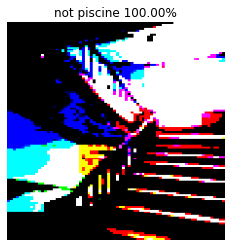

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


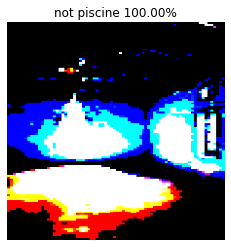

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


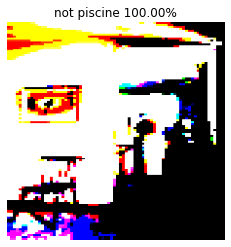

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


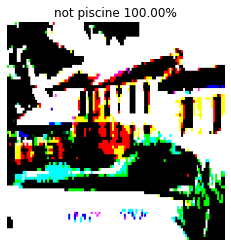

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


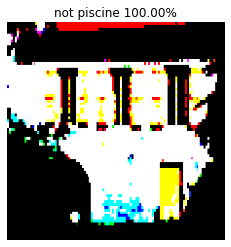

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


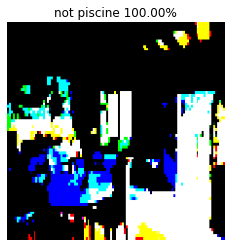

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


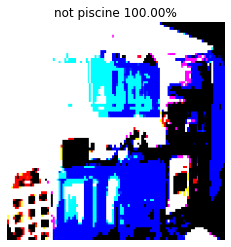

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


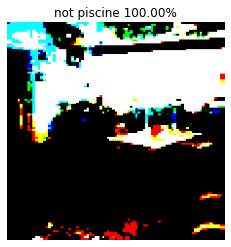

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


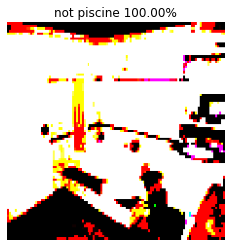

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


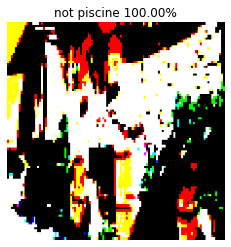

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


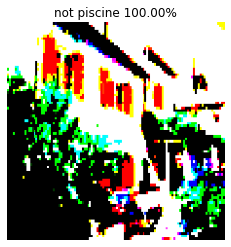

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


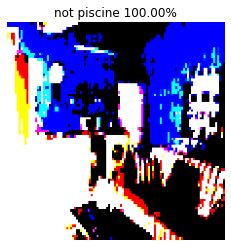

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


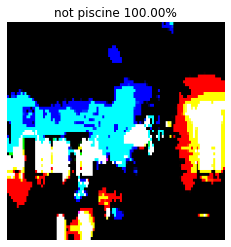

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


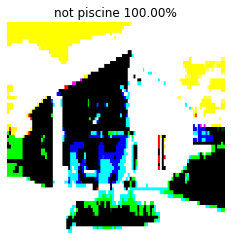

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


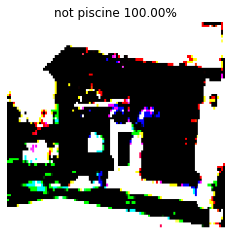

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


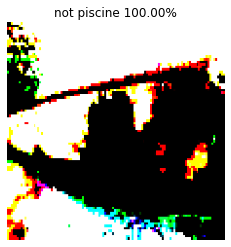

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


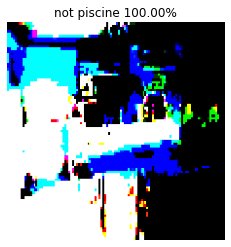

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


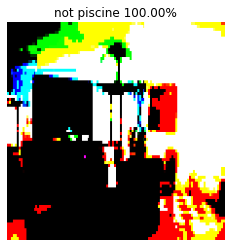

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


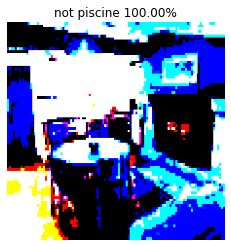

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


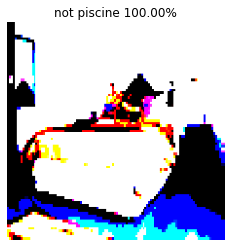

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


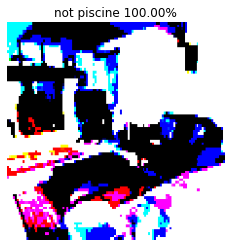

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


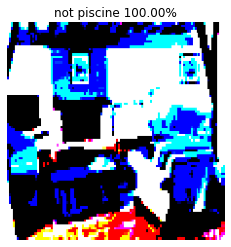

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


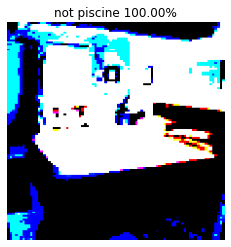

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


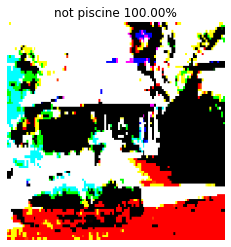

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


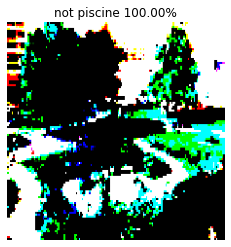

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


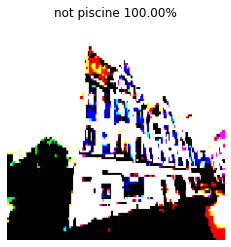

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


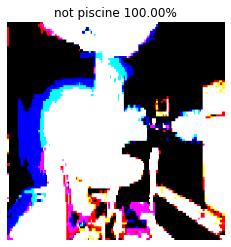

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


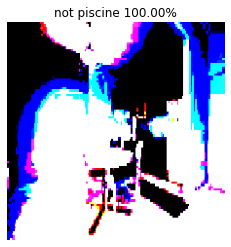

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


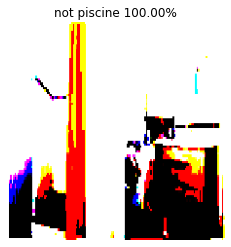

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


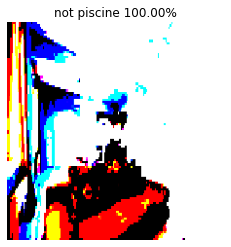

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


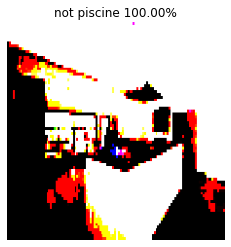

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


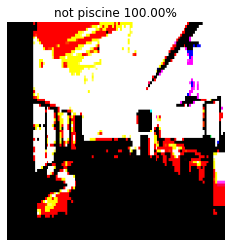

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


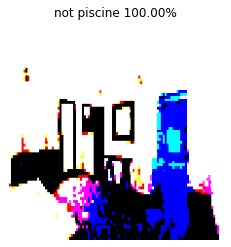

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


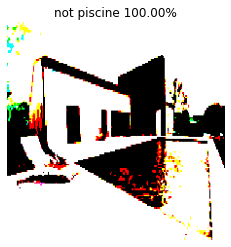

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


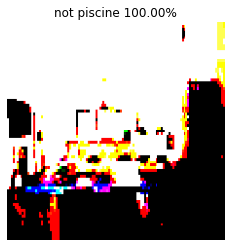

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


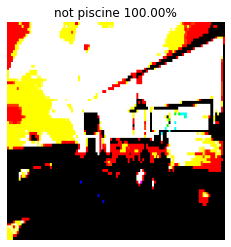

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


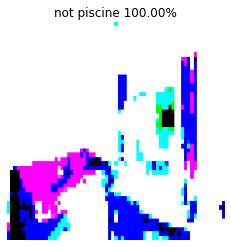

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


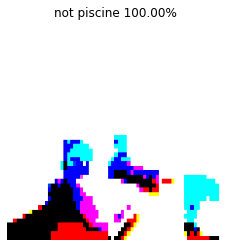

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


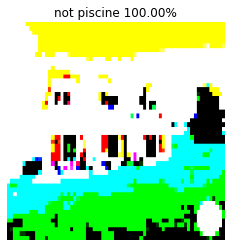

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


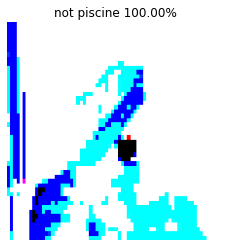

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


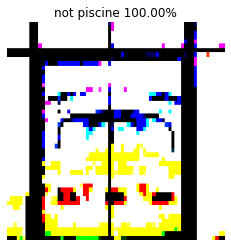

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


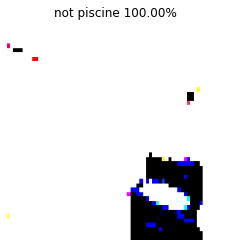

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


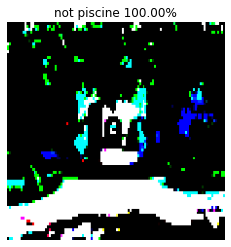

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


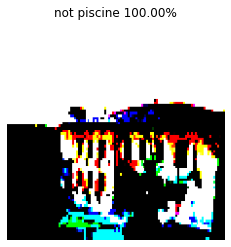

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


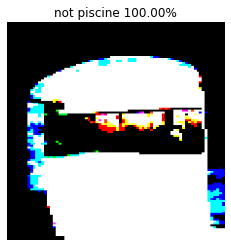

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


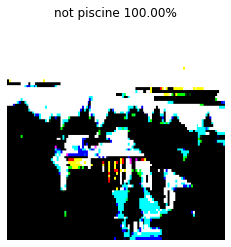

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


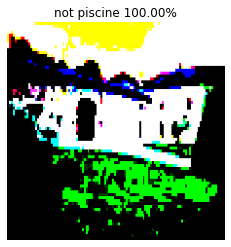

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


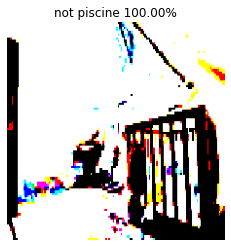

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


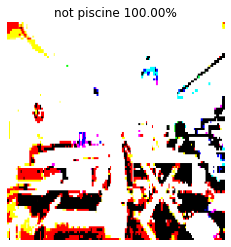

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


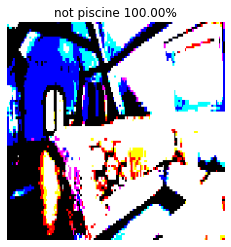

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


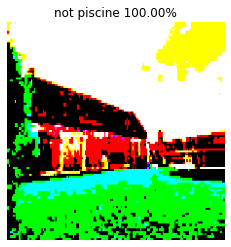

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


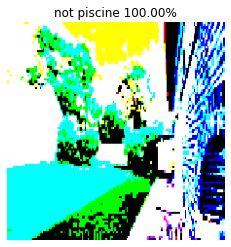

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


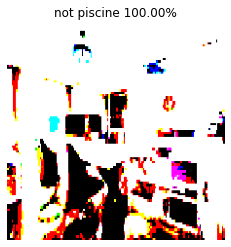

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


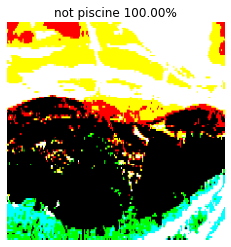

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


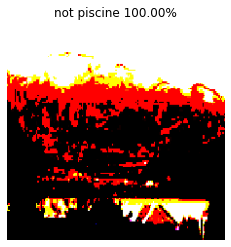

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


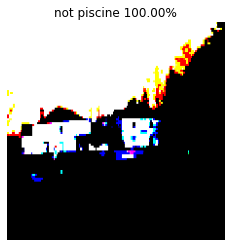

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


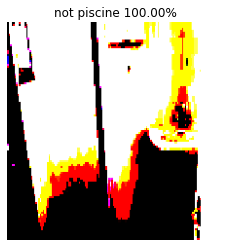

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


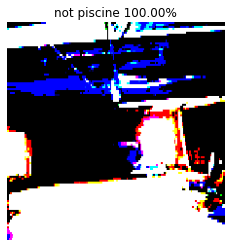

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


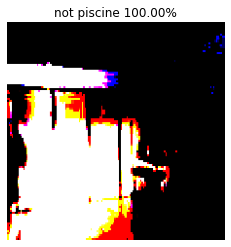

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


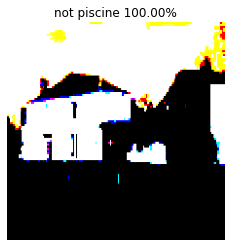

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


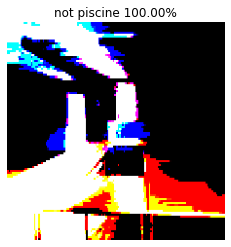

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


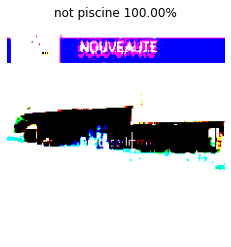

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


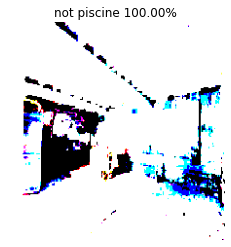

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


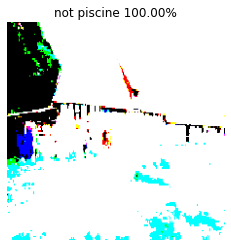

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


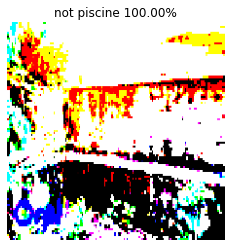

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


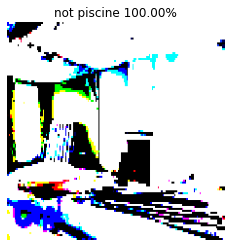

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


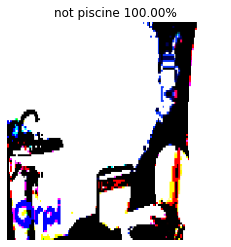

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


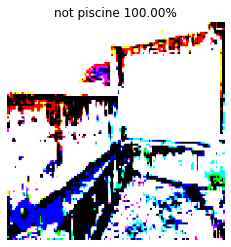

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


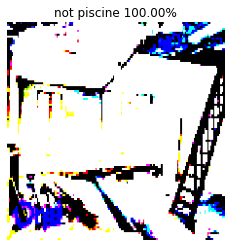

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


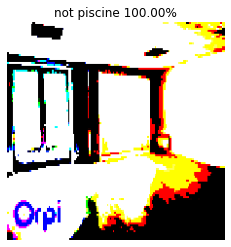

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


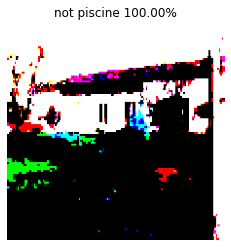

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


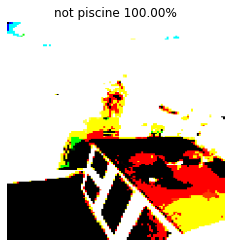

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


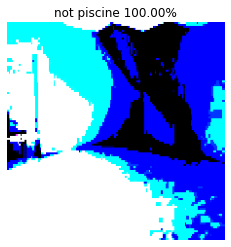

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


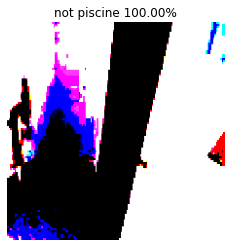

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


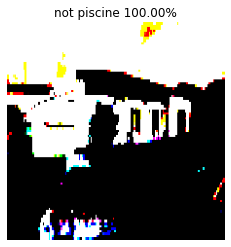

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


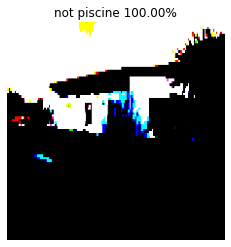

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


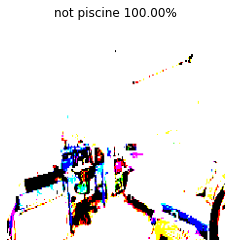

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


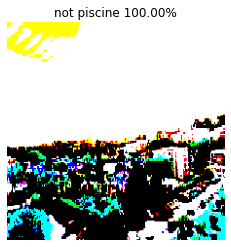

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


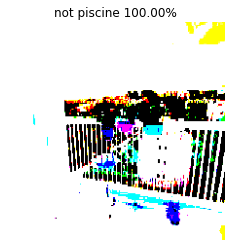

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


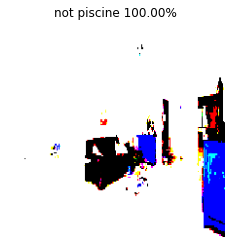

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


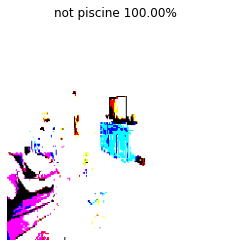

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


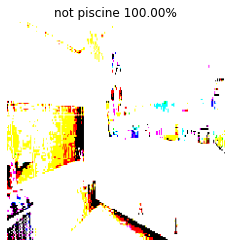

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


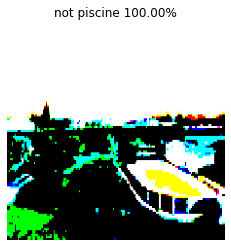

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


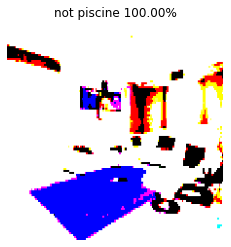

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


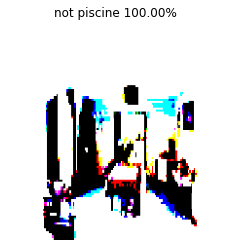

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


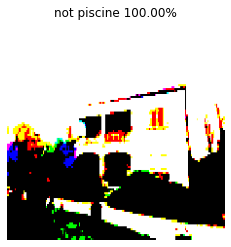

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


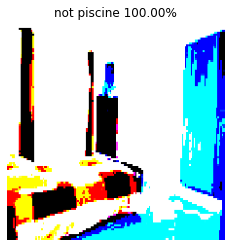

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


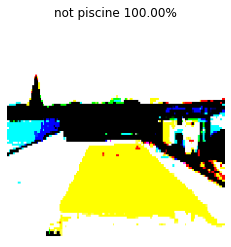

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


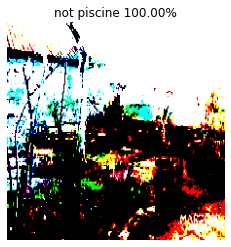

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


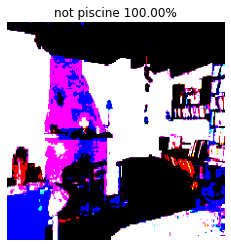

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


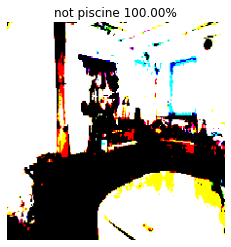

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


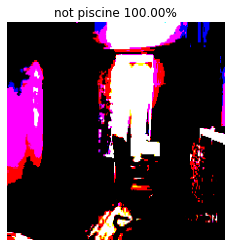

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


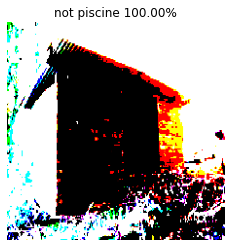

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


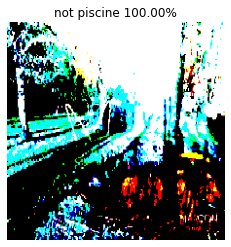

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


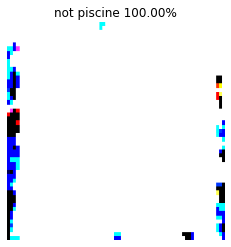

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


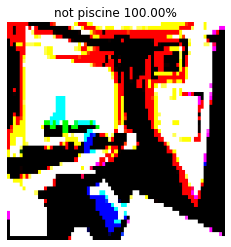

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


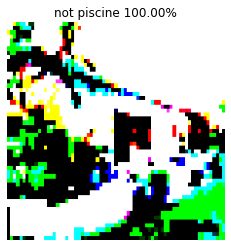

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


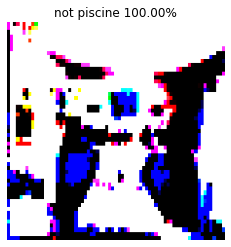

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


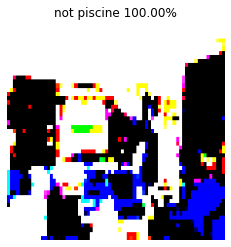

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


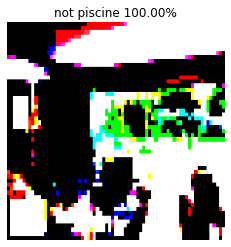

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


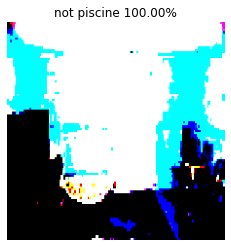

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


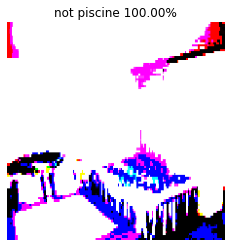

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


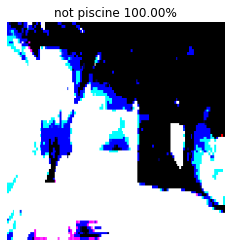

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


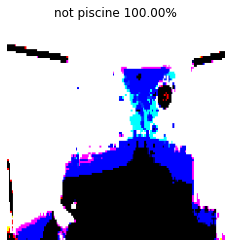

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


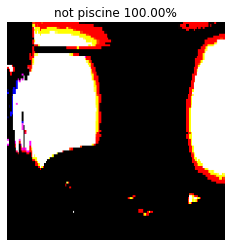

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


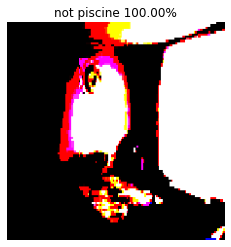

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


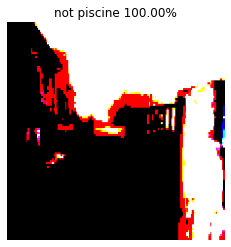

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


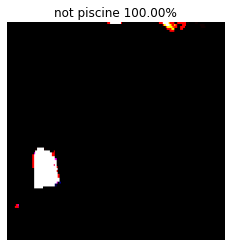

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


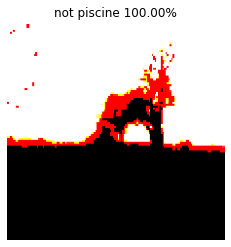

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


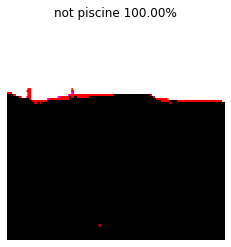

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


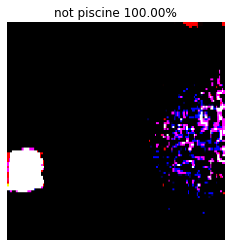

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


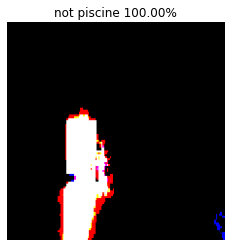

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


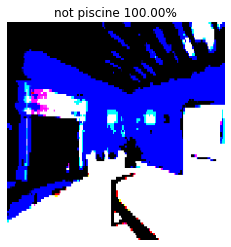

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


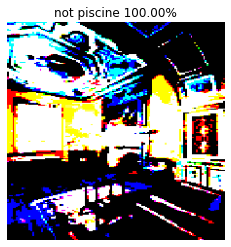

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


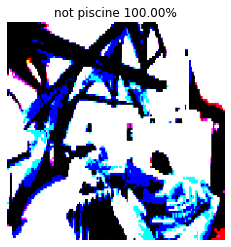

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


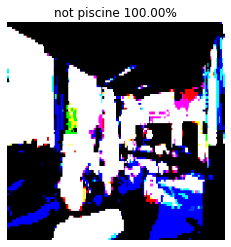

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


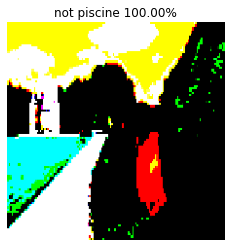

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


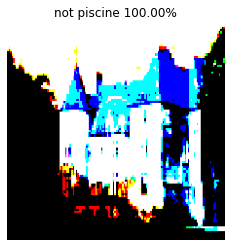

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


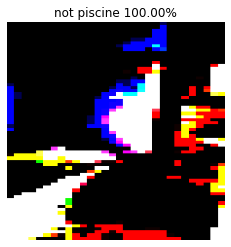

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


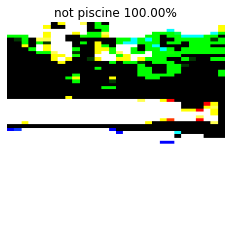

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


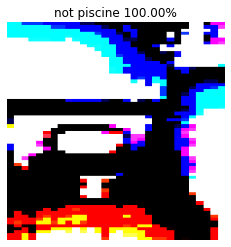

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


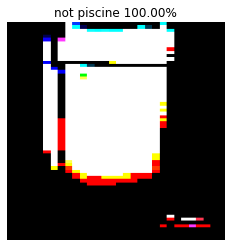

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


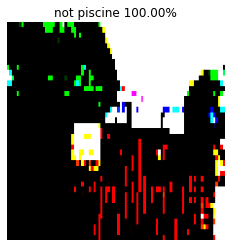

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


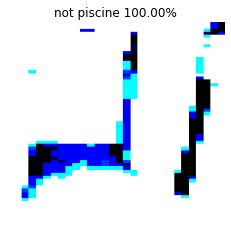

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


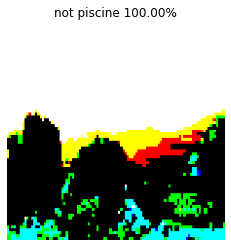

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


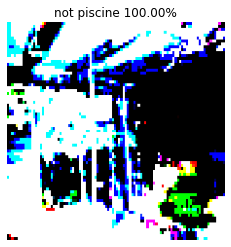

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


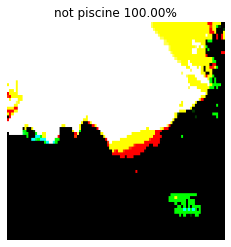

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


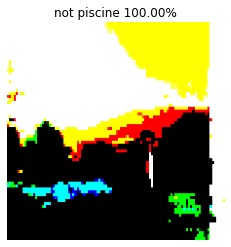

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


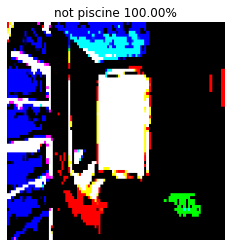

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


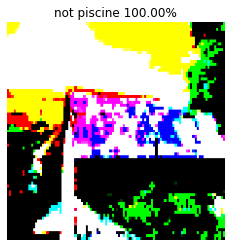

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


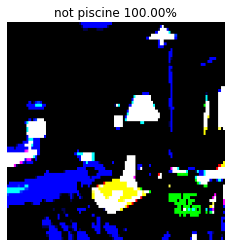

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


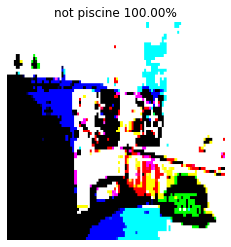

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


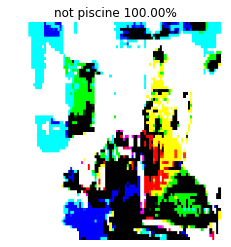

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


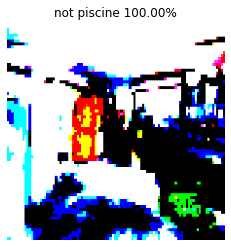

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


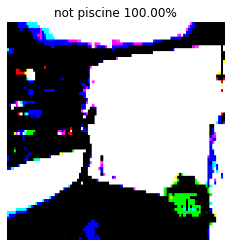

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


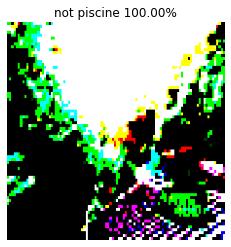

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


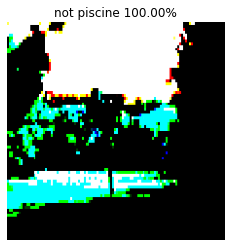

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


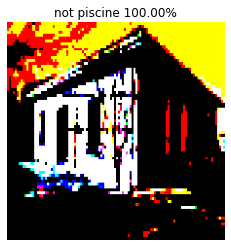

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


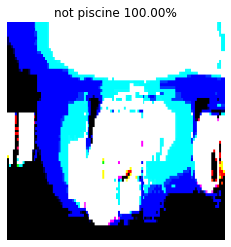

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


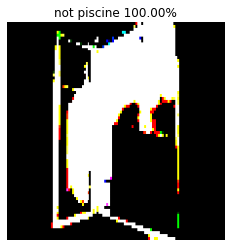

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


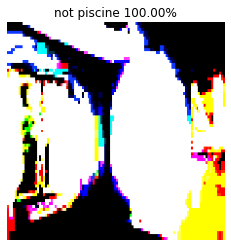

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


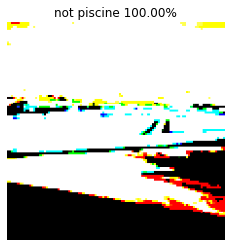

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


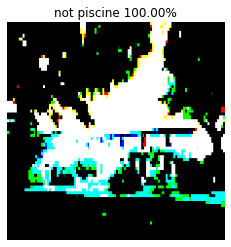

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


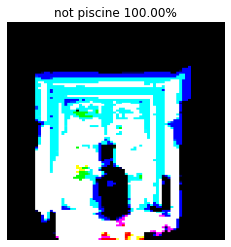

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


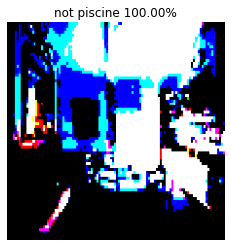

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


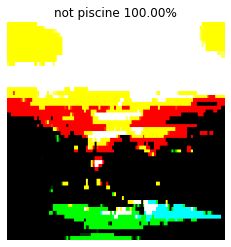

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


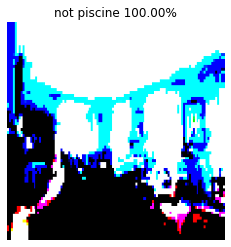

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


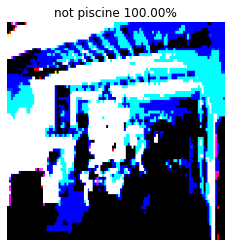

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


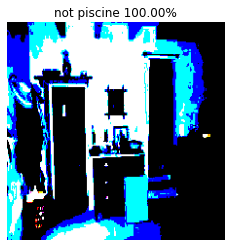

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


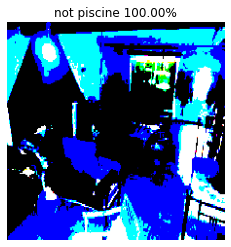

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


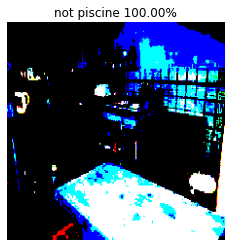

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


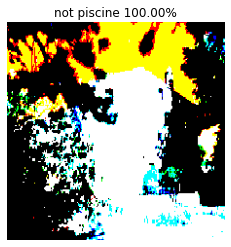

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


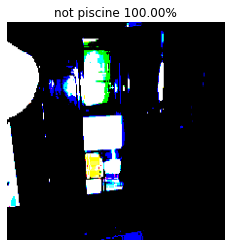

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


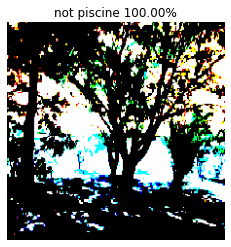

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


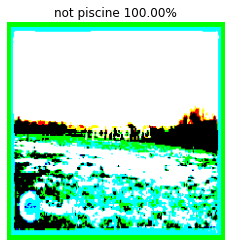

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


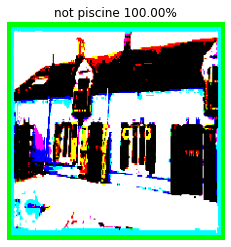

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


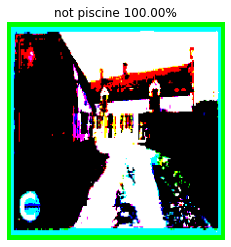

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


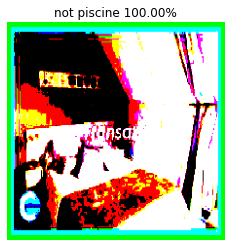

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


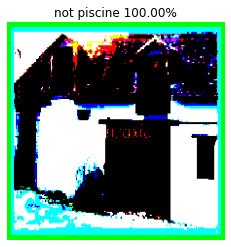

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


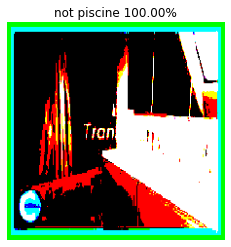

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


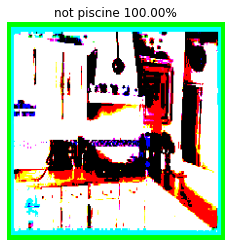

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


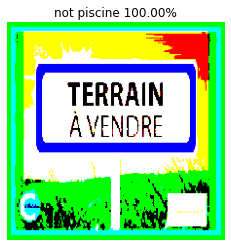

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


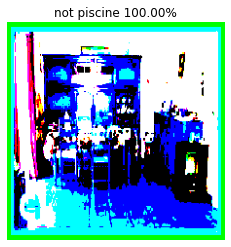

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


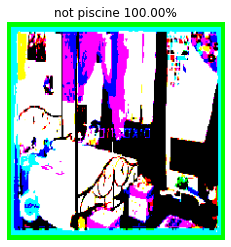

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


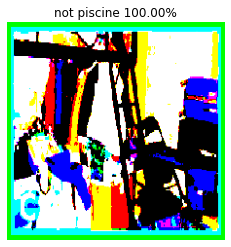

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


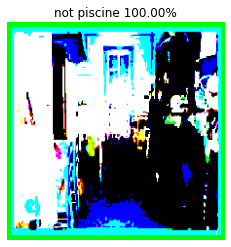

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


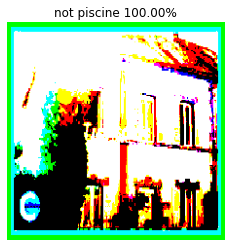

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


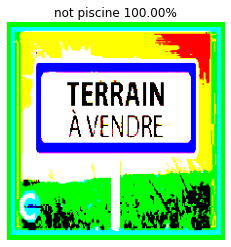

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


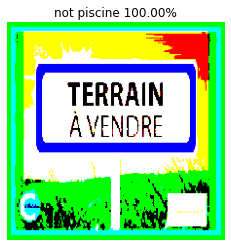

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


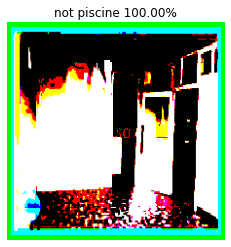

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


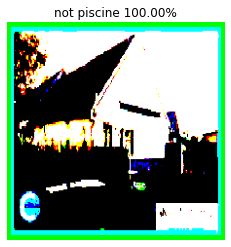

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


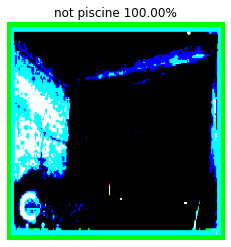

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


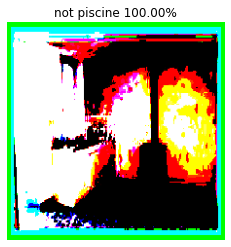

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


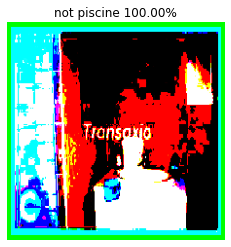

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


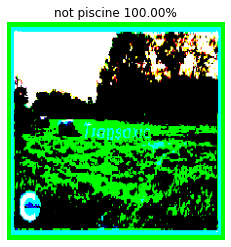

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


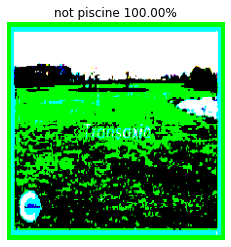

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


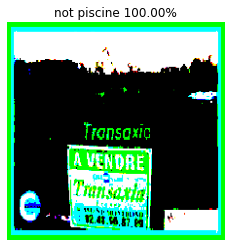

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


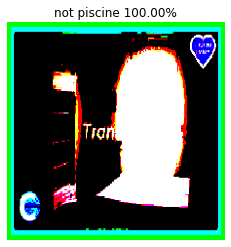

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


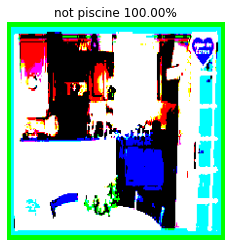

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


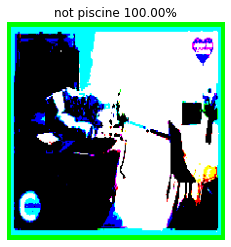

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


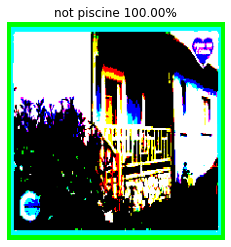

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


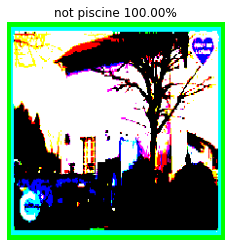

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


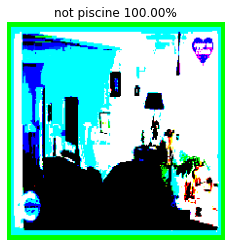

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


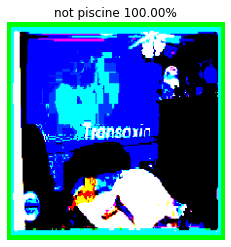

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


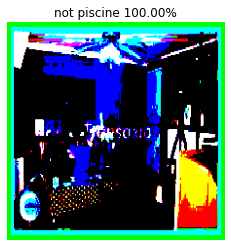

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


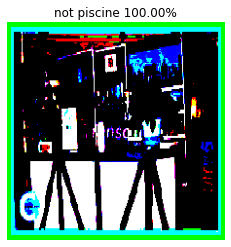

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


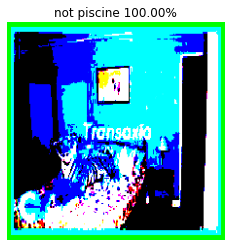

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


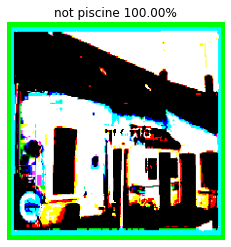

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


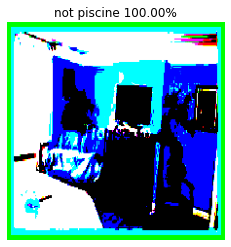

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


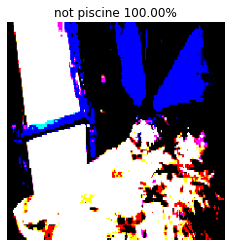

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


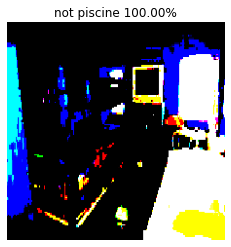

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


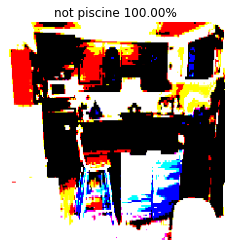

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


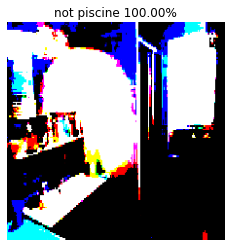

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


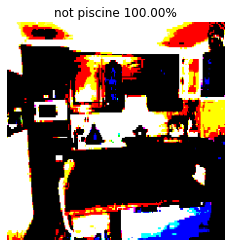

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


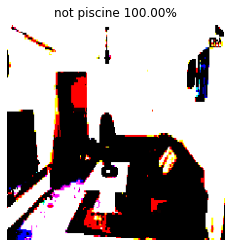

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


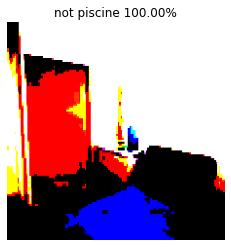

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


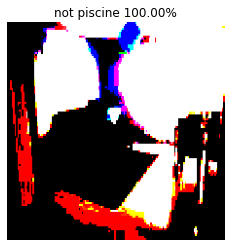

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


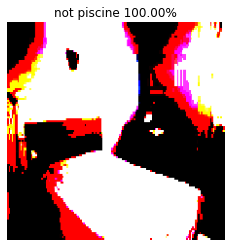

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


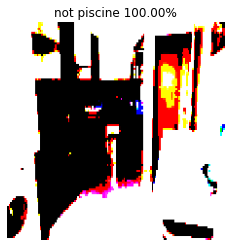

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


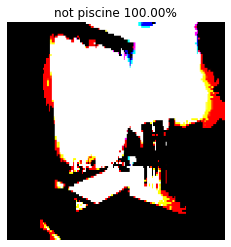

In [167]:
from keras import models

# Extracts the outputs of the top 4 layers:
layer_outputs = [layer.output for layer in model.layers[:4]]
# Creates a model that will return these outputs, given the model input:
activation_model = model

def preprocess_image(img_path):
    image = load_img(img_path, target_size=image_size)
    image = img_to_array(image) 
    # change it to shape [1, 150, 150, 3]
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    #img_tensor = np.expand_dims(img_tensor, axis=0)
    #img_tensor /= 255.
    return image

plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        img = preprocess_image(filename)
        prediction = model.predict(img)
        #plt.subplot(5, 5, index+1)
        if prediction[0][0] > 0.5:
            plt.title('not piscine %.2f%%' % (100 - prediction[0][1]*100))
        else:
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))

        plt.axis('off')
        plt.imshow(img[0])
        plt.show()

 

# <center> VGG16 </center>

#### Nous allons utiliser un modèle déjà entrainé sous le nom de VGG16
Cet algorithme contient des paramètres déjà entrainé

In [175]:
TEST_PATH_ = 'D:/steve/reduced_images/train/'
test_ = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_PATH_,
    label_mode=None,
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

### Cet algorithme est entrainé sur environ 1000 catégorie, nous avons donc changé la sortie du réseau en ajoutant une sortie binaire sur la dernière couche

In [176]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input


#def add_new_classifier_head(feature_extractor_model):
#    model = Sequential([ feature_extractor_model, feature_extractor_model.input,
#        tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
#  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
#tf.keras.layers.experimental.preprocessing.RandomCrop(224,224),
#    tf.keras.layers.experimental.preprocessing.Rescaling(1./255), 
#        Dense(2, activation='softmax')])
    
#    return model


model = VGG16(weights='imagenet', include_top=True)
model.trainable = False
print(model.output.shape)
y = Dense(2, activation='softmax')((model.layers[-2].output))#final layer with softmax activation
model = Model(inputs=model.input, outputs=y, name="VGG16")
model.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy','AUC',"Recall"])
print(model.summary())

(None, 1000)
Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_67 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)

### Plot des Metrics et des Loss

Epoch 1/8
9/9 [==============================] - 49s 5s/step - loss: 0.5087 - accuracy: 0.7899 - auc: 0.8764 - recall: 0.7899 - val_loss: 0.4460 - val_accuracy: 0.8125 - val_auc: 0.9275 - val_recall: 0.8125
Epoch 2/8
9/9 [==============================] - 44s 5s/step - loss: 0.1648 - accuracy: 0.9377 - auc: 0.9827 - recall: 0.9377 - val_loss: 0.3160 - val_accuracy: 0.8750 - val_auc: 0.9529 - val_recall: 0.8750
Epoch 3/8
9/9 [==============================] - 41s 5s/step - loss: 0.0878 - accuracy: 0.9728 - auc: 0.9926 - recall: 0.9728 - val_loss: 0.3720 - val_accuracy: 0.8750 - val_auc: 0.9402 - val_recall: 0.8750
Epoch 4/8
9/9 [==============================] - 41s 5s/step - loss: 0.0497 - accuracy: 0.9844 - auc: 0.9982 - recall: 0.9844 - val_loss: 0.3148 - val_accuracy: 0.8750 - val_auc: 0.9551 - val_recall: 0.8750
Epoch 5/8
9/9 [==============================] - 41s 5s/step - loss: 0.0247 - accuracy: 0.9961 - auc: 0.9999 - recall: 0.9961 - val_loss: 0.3386 - val_accuracy: 0.8750 - va

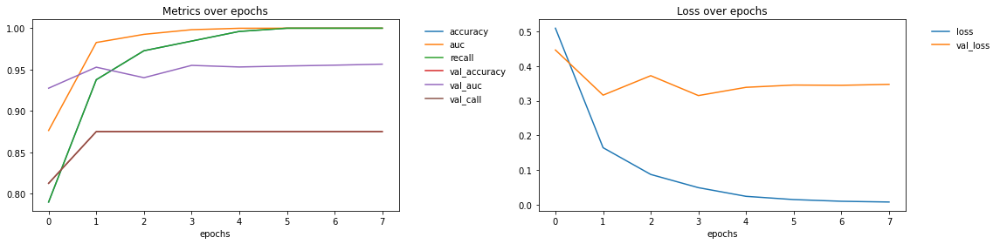

In [177]:

history = model.fit(train_ds, epochs=8, validation_data=val_ds)

fig, axs = plt.subplots(1, 2, figsize=(16, 4))

axs[0].plot(history.history["accuracy"], label="accuracy")
axs[0].plot(history.history["auc"], label="auc")
axs[0].plot(history.history["recall"], label="recall")


axs[0].plot(history.history["val_accuracy"], label="val_accuracy")
axs[0].plot(history.history["val_auc"], label="val_auc")
axs[0].plot(history.history["val_recall"], label="val_call")

axs[0].set_title("Metrics over epochs")
axs[0].set_xlabel("epochs")

axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

axs[1].plot(history.history["loss"], label="loss")
axs[1].plot(history.history["val_loss"], label="val_loss")

axs[1].set_title("Loss over epochs")
axs[1].set_xlabel("epochs")
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

fig.tight_layout()
plt.show()

In [178]:
test_iamges  = os.listdir(TEST_PATH_)

from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import decode_predictions

from keras.applications.vgg16 import preprocess_input

def preprocess_imageVGG(img_path):
    image = load_img(img_path, target_size=image_size)
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    return image



def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
    if len(x.shape) != 3:
        raise ValueError("Invalid input to deprocessing image")

    # perform the inverse of the preprocessiing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]

    x = np.clip(x, 0, 255).astype('uint8')
    return x

### Prédiction sur un plus petit échantillon de test (561 lignes)

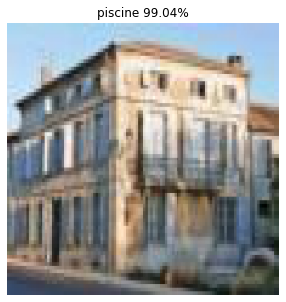

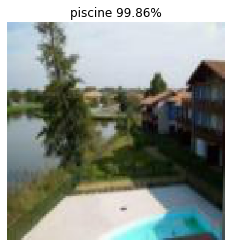

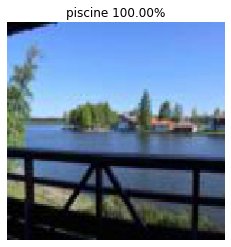

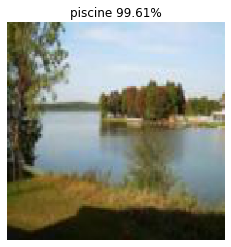

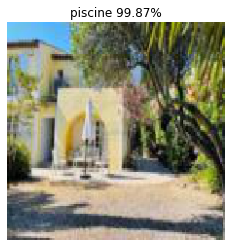

...

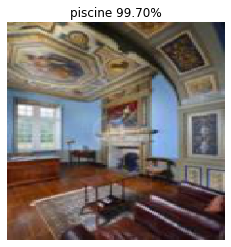

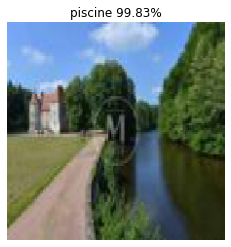

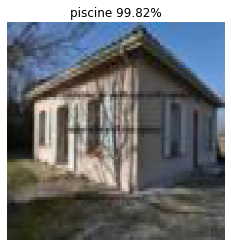

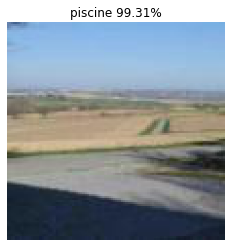

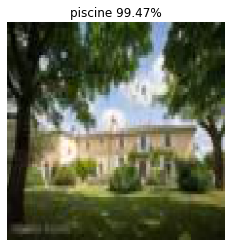

In [180]:
test_iamges  = os.listdir(TEST_PATH)

plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        img = preprocess_imageVGG(filename)
        prediction = model.predict(img)
        if prediction[0][1]>0.99:
            plt.axis('off')
            ima_dep= deprocess_img(img)
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))
            plt.imshow(ima_dep)
            plt.show()
        
    

### On peut voir que notre VGG16 arrive à prédire avec une proba >99.87% des piscines

### Test sur toutes nos images

In [102]:
test_iamges  = os.listdir(TEST_PATH_)

dic_ = {"annonce": [],"nom_image":[],"prediction_1" : []}

plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        if (filename.endswith(".png") or filename.endswith(".jpg")) and os.path.getsize(path+'/'+filename)>0:
            img = preprocess_imageVGG(filename)
            prediction = model.predict(img)
            dic_["annonce"].append(image.split("_")[1])
            dic_["nom_image"].append(file)
            dic_["prediction_1"].append(prediction[0][1])
            continue
        else:
            continue  

<Figure size 360x360 with 0 Axes>

In [118]:
df=pd.DataFrame(dic_)
df['piscine']=df['prediction_1']>0.997
df['piscine']=df['piscine'].astype(int)
df_to_merge = df.groupby(['annonce'])["piscine"].sum().to_frame()

,annonce,nom_image,prediction_1
0,ann_10767060,D:/steve/reduced_images/test_piscine/ann_10767...,0.043941
1,ann_10767060,D:/steve/reduced_images/test_piscine/ann_10767...,0.122804
2,ann_10767060,D:/steve/reduced_images/test_piscine/ann_10767...,0.005067
3,ann_10767060,D:/steve/reduced_images/test_piscine/ann_10767...,0.145317
4,ann_10767060,D:/steve/reduced_images/test_piscine/ann_10767...,0.322868
...,...,...,...
556,ann_9229368,D:/steve/reduced_images/test_piscine/ann_92293...,0.001834
557,ann_9229368,D:/steve/reduced_images/test_piscine/ann_92293...,0.000408
558,ann_9229368,D:/steve/reduced_images/test_piscine/ann_92293...,0.003428
559,ann_9229368,D:/steve/reduced_images/test_piscine/ann_92293...,0.011407


In [217]:
#df.groupby(['annonce'])["piscine"].value_counts()


annonce       piscine
ann_10767060  1          4
              0          2
ann_10888487  0          3
              1          3
ann_10914429  0          4
                        ..
ann_21407347  1          6
ann_6774630   0          5
              1          1
ann_9229368   0          4
              1          1
Name: piscine, Length: 191, dtype: int64

In [ ]:
#df.groupby(["annonce","piscine"]).count()

In [203]:
#df.groupby((df.piscine == 1).astype(int)).count()

,annonce,nom_image,prediction_1,piscine
piscine,,,,
0,245,245,245,245
1,316,316,316,316


# FIN DES FEATURES : PLACE AU MODELE

In [1]:
df_image = df_image.merge(df_to_merge,how='left',left_on='id_annonce',right_index=True))
data=data.merge(df_image,how='left',left_on='id_annonce',right_index=True)
data

NameError: name 'df' is not defined

In [ ]:
new_features_image_num=df_image.columns[:-1].values.tolist()
new_features_image_cat=df_image.columns[-1]
new_features_image_num

In [ ]:
numerical_features_orgin=['approximate_latitude','approximate_longitude','size_correct','floor','land_size_correct', \
                          'energy_performance_value','ghg_value','nb_rooms','nb_bedrooms','nb_bathrooms',\
                          'nb_parking_places','nb_boxes','nb_photos','has_a_balcony','nb_terraces','has_a_cellar',\
                          'has_a_garage','has_air_conditioning','last_floor','upper_floors','postal_code',] 
additional_n_features= ['ecole_count', 'Min_gare', 'nb_gare_1kms', 'nb_gare_3kms',\
                        'nb_gare_5kms', 'nb_gare_10kms', 'nb_gare_20kms', 'Min_ecole',\
                        'nb_ecole_1kms', 'nb_ecole_3kms', 'nb_ecole_5kms',\
                        'nb_ecole_10kms', 'nb_ecole_20kms', 'company_city_count']

keep_additional_features=['ecole_count','Min_ecole','nb_ecole_1kms','Min_gare','nb_gare_1kms',\
                          'nb_gare_20kms','company_city_count']

numerical_features=numerical_features_orgin+keep_additional_features+new_features_image_num

categorical_features=['property_type','city','energy_performance_category','ghg_category','exposition']

features_all=numerical_features+categorical_features+new_features_image_cat

target='price_log'

# première analyse de correlation et importances des features : Drop : code postal, nb_rooms, longitude, latitude
list_sup=['nb_rooms','city','last_floor']
for tosup in list_sup:
    features_all.remove(tosup)
    if tosup in numerical_features:
        numerical_features.remove(tosup)
    if tosup in categorical_features:
        categorical_features.remove(tosup)
    
features_all

In [ ]:
numerical_features_0=['floor','land_size_correct']
numerical_features_mean=[i for i in numerical_features if not i in numerical_features_0]

In [ ]:
models_BestParam = [('GradientB_reg',GradientBoostingRegressor(loss='lad',learning_rate=0.1,max_depth= 5,\
                                                     n_estimators=500,subsample= 0.8)),
          
          
          ('adaboost',AdaBoostRegressor(random_state=0,learning_rate=0.9,n_estimators=100,loss='linear',\
                          base_estimator=DecisionTreeRegressor(max_depth= 6,min_samples_leaf= 0.01))),
          
          
          ("xgboost",  XGBRegressor(min_child_weight=0,learning_rate=0.09,n_estimators= 3000,\
                       gamma=0, subsample=0.7,max_depth= 6,\
                       colsample_bytree=1.0,\
                       objective='reg:squarederror', nthread=-1,\
#                       eval_metric='mape',\ #Ne marche pas sous version Mac mais résultats identiques
                       scale_pos_weight=1, seed=27,\
                       reg_alpha=0.00006))
         ]



numeric_transformer0 = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="constant", fill_value=0)),
                                    ('scaler', StandardScaler())])# to deal with missing numeric data : 0

numeric_transformer_mean = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="mean")),
                                    ('scaler', StandardScaler())])# to deal with missing numeric data : mean

categorical_transformer = Pipeline(steps=[
                                    ("imputer", SimpleImputer(strategy="constant", fill_value="Not defined")),
                                    ("onehot", OneHotEncoder(handle_unknown='ignore'))]) # to deal with missing categorical data 

preproc = ColumnTransformer(transformers=[("num0", numeric_transformer0, numerical_features_0),
                                          ("num_mean", numeric_transformer_mean, numerical_features_mean),
                                          ("cat", categorical_transformer, categorical_features)])


save_model=[]
for name, model in models_BestParam:
    start_time=time.time()
    pipe_BestParam = Pipeline(steps=[('preprocessor', preproc), (name, model)])
    pipe_BestParam.fit(X_train, y_train)
    save_model.append(pipe_BestParam)
    print(name)
    print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))
    print('-----------------------------------------------------')

In [ ]:
def plot_tab_score(all_tab,name_models):
    fig, axs = plt.subplots(3, 2, figsize=(16, 10))
    all_log=[x[0] for x in all_tab]
    all_normal=[x[1] for x in all_tab]
    #name=['RdmForest','Gradient_Boost','Ada_Boost','XGBoost']
    name_metrics=all_log[0].index
    for metric in range(len(name_metrics)):
        for table in all_log:
            #tab_score.iloc[1,:]
            axs[metric,0].plot(table.iloc[metric,:])

            #plt.plot(tab_score_xgb.iloc[1,:])
        axs[metric,0].set_title((name_metrics[metric]))
        axs[metric,0].legend(name_models)
    for metric in range(len(name_metrics)):
        for table in all_normal:
            #tab_score.iloc[1,:]
            axs[metric,1].plot(table.iloc[metric,:])

            #plt.plot(tab_score_xgb.iloc[1,:])
        axs[metric,1].set_title((name_metrics[metric]))
        axs[metric,1].legend(name_models)
        
#Fonctions permettant d'afficher des résultats

def metrics_score(y_real,y_pred):
    mean_squared_error1 = round(mean_squared_error(y_real, y_pred),4)
    explained_variance_score1 = round(explained_variance_score(y_real, y_pred),4)
    mean_absolute_percentage_error1 = round(mean_absolute_percentage_error(y_real, y_pred),4)
    return({'mean_squared_error' : mean_squared_error1,
            'explained_variance_score' : explained_variance_score1,
            'mean_absolute_percentage_error' : mean_absolute_percentage_error1*100,
           })


def score_log_normal(X_train,X_test,y_train,y_test,model):
    y_pred_train_log = model.predict(X_train)
    y_pred_test_log = model.predict(X_test)
    y_pred_train = np.expm1(y_pred_train_log)
    y_pred_test = np.expm1(y_pred_test_log)
    
    
    dic_train_log=metrics_score(y_train,y_pred_train_log)
    dic_test_log=metrics_score(y_test,y_pred_test_log) 
    tab_score_log=pd.DataFrame(dic_train_log.values(),index=list(dic_train_log.keys()),columns=['Train'])
    tab_score_log['Test']=dic_test_log.values()
    print('\033[1m' +'Sur prix Log'+ '\033[0m')
    print(tab_score_log,end='\n\n')
    
    dic_train=metrics_score(np.expm1(y_train),y_pred_train)
    dic_test=metrics_score(np.expm1(y_test),y_pred_test)
    
    tab_score=pd.DataFrame(dic_train.values(),index=list(dic_test.keys()),columns=['Train'])
    tab_score['Test']=dic_test.values()
    print('\033[1m' +'Sur prix Normaux'+ '\033[0m')
    print(tab_score)
    return [tab_score_log,tab_score]

In [ ]:
all_tab=[]

name=['Gradient_Boost','Ada_Boost','XGBoost']

for i in range(len(save_model)):
    name_m=name[i]
    model=save_model[i]

    print('Résultat pour',name_m,end='\n\n')
    all_tab.append(score_log_normal(X_train,X_test,y_train,y_test,model))
    print('')
    print('#################'*3,end='\n\n')

In [ ]:
plot_tab_score(all_tab,['Gradient_Boost','Ada_Boost','XGBoost'])